# Imports

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.colors import Normalize
from matplotlib.ticker import FuncFormatter, PercentFormatter

plt.style.use('ggplot')

COLOR_FEMALE = cm.get_cmap("RdBu")(220) # set blue for female
COLOR_MALE = cm.get_cmap("RdBu")(35) # set red for male
TITLE_SIZE = 22
TITLE_PADDING = 10

import seaborn as sns

params = {
    'text.color': (0.25, 0.25, 0.25),
    'figure.figsize': [12, 5],
   }
plt.rcParams.update(params)

import pandas as pd
pd.options.display.max_rows = 500

import numpy as np
from numpy import percentile
np.random.seed(42)

import copy
import os
import sys
import glob
from shutil import copyfile
import time
from tabulate import tabulate
from tqdm.notebook import tqdm

import IPython.display as ipd

In [2]:
from sklearn.preprocessing import StandardScaler, QuantileTransformer
from sklearn.decomposition import PCA
import umap 

In [3]:
import librosa
import librosa.display

import pydub
from pydub import AudioSegment, effects

from aubio import source, pitch

In [4]:
import warnings
warnings.filterwarnings('ignore')

In [5]:
# # print Pandas version and dependencies for reproducability
# print("Pandas version and dependencies")
# print(pd.__version__)
# print(pd.show_versions())

# 1) CommonVoice: EDA metadata

- The [Mozilla CommonVoice](https://commonvoice.mozilla.org/en/datasets) project has created crowdsourced data sets that are freely available. 
- At the time of writing the data sets contain a total of more than 9'000 recorded hours (7k+ validated) in 60 languages. 
- The recordings are short utterances between roughly 2 and 20 seconds. 
- Unfortunately **no Swissgerman data set is available** apart from some few recordings of Swissgerman speakers but with language label «German» (see below).
- According to the CommonVoice website *«each entry in the dataset consists of a ***unique MP3*** and ***corresponding text file***. Many of the 9,283 recorded hours in the dataset also include ***demographic metadata like age, sex, and accent***»*. 

I have downloaded the data for all 4 official languages used in Switzerland: German, French, Italian and Romansh. 

**I'll primarily examine the German data set which is likely the most important one for my project.**

The audio files [are being validated by users](https://discourse.mozilla.org/t/discussion-of-new-guidelines-for-recording-validation/36465). Files are rejected if they do not contain a recording of the full text, are of low quality, have background voice or noise, are sung or are computer generated. 

Since we apparently have a lot of data and podcasts mostly will be of good quality **it seems sensible to consider only validated files** and just load `validated.tsv`.

In [6]:
language = "_german"
df = pd.read_csv(f"_data/CommonVoice/{language}/validated.tsv", sep="\t")

- **The subset for German contains more than 565k audio samples.**
- Memory consumption of the **metadata** is moderate.
- The corresponding audio files are ~25GB from which I have to extract features. That will likely be tougher in terms of compute.
- There seem to be no exact duplicates in the data.

In [7]:
df.info(memory_usage="deep")
print()
exact_duplicates = df.duplicated().sum()
print(f"There are {len(df) :,.0f} observations and {len(df.columns)} features in total.")
print(f"There are {exact_duplicates} exact duplicates in the data set.")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 565186 entries, 0 to 565185
Data columns (total 10 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   client_id   565186 non-null  object
 1   path        565186 non-null  object
 2   sentence    564213 non-null  object
 3   up_votes    565186 non-null  int64 
 4   down_votes  565186 non-null  int64 
 5   age         437989 non-null  object
 6   gender      437294 non-null  object
 7   accent      396919 non-null  object
 8   locale      565186 non-null  object
 9   segment     13648 non-null   object
dtypes: int64(2), object(8)
memory usage: 362.6 MB

There are 565,186 observations and 10 features in total.
There are 0 exact duplicates in the data set.


**Several features have missing values**.

In [8]:
missing = [(c, df[c].isna().mean()*100) for c in df]
missing = pd.DataFrame(missing, columns=["column_name", "percentage"])
missing = missing[missing.percentage > 0]
print("Percentage of missing values")
print(tabulate(missing.sort_values("percentage", ascending=False), floatfmt=".1f", showindex=False))

Percentage of missing values
--------  ----
segment   97.6
accent    29.8
gender    22.6
age       22.5
sentence   0.2
--------  ----


Each row of the data represents a single audio clip and contains the following information (reference [here](https://github.com/common-voice/cv-dataset)):

- `client_id` - hashed UUID of a given user
- `path` - relative path of the audio file
- `sentence` - text that has been recorded by the user
- `up_votes` - number of people who said audio matches the text
- `down_votes` - number of people who said audio does not match text
- `age` - age of the speaker
- `gender` - gender of the speaker
- `accent` - accent of the speaker
-  `locale` - identifier for the language
- `segment` - if sentence belongs to a custom dataset segment, it will be listed here

**In a first step I clean and simplify the data by**:
- removing all samples where `gender` is missing (it is our target variable and samples without this label are useless)
- mapping the hash of `client_id` to an integer to facilitate the handling of the feature
- mapping the textual values for `age` («twenties», «thirties», «fourties» etc.) to integers for easier sorting
- calculating the number of words from `sentence` to get a rough estimate of the length of the recording
- removing `sentence` > I don't need the transcription
- removing `segment` > no use for this feature
- removing `locale` > only one value `de`, therefore redundant
- removing the up/down-votes > matching the text in the recording isn't important for my use case

In [9]:
# drop all samples where label for target variable is missing
df.dropna(subset=["gender"], inplace=True)

# simplify client_id
mapping = dict(zip(df.client_id.unique(), range(df.client_id.nunique())))
df.client_id = df.client_id.map(mapping)

# map textual values for age to integers
ages = ['teens', 'twenties', 'thirties', 'fourties', 'fifties', 'sixties',
       'seventies', 'eighties', 'nineties']
ages_int = range(10, 100, 10)
mapping = dict(zip(ages, ages_int))
df.age = df.age.map(mapping)

# get word_count as rough measure of recording length
df["word_count"] = df.sentence.apply(lambda x: len(str(x).split()))

# drop useless features
df.drop(["sentence", "segment", "locale", "up_votes", "down_votes"], axis=1, inplace=True)

- After this first cleaning step I have around 437k samples left. 
- Features `age` and `accent` still have missing values.

In [10]:
df.reset_index(drop=True, inplace=True)
display(df.info())
print()
display(pd.concat([df.head(3), df.tail(3)]))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 437294 entries, 0 to 437293
Data columns (total 6 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   client_id   437294 non-null  int64  
 1   path        437294 non-null  object 
 2   age         436146 non-null  float64
 3   gender      437294 non-null  object 
 4   accent      393508 non-null  object 
 5   word_count  437294 non-null  int64  
dtypes: float64(1), int64(2), object(3)
memory usage: 20.0+ MB


None

,client_id,path,age,gender,accent,word_count
0,0,common_voice_de_18520278.mp3,30.0,male,russia,5
1,1,common_voice_de_19625120.mp3,40.0,other,france,12
2,2,common_voice_de_21387840.mp3,20.0,female,germany,7
437291,3749,common_voice_de_24043080.mp3,40.0,male,germany,10
437292,3749,common_voice_de_24043084.mp3,40.0,male,germany,8
437293,3749,common_voice_de_24043090.mp3,40.0,male,germany,12


## Observations from `client_id`
- **3'750 people have made recordings** (or more precisely: so many unique `client_id`s are recorded).
- **The median of recordings per contributor is 20.5**.
- Some people have contributed amazingly large amounts of samples. The top contributor has recorded almost 39k texts! 😲 **To avoid a bias towards just a few voices in training I need to carefully balance out the data** to retrieve a sufficiently varied selection.

In [11]:
print("Statistics from feature client_id")
print(tabulate(df.client_id.value_counts().to_frame().describe(), floatfmt=".1f"))

Statistics from feature client_id
-----  -------
count   3750.0
mean     116.6
std      818.4
min        1.0
25%        9.0
50%       20.5
75%       67.0
max    38831.0
-----  -------


In [12]:
top_n = 10
print(f"Top {top_n} contributing participants\nand the number of their recordings")
print(tabulate(df.client_id.value_counts()[:top_n].to_frame()))

Top 10 contributing participants
and the number of their recordings
----  -----
3749  38831
3748  21149
3747  11215
3746   7417
3745   5924
3744   5755
3743   5663
3742   5104
3741   5018
3740   4954
----  -----


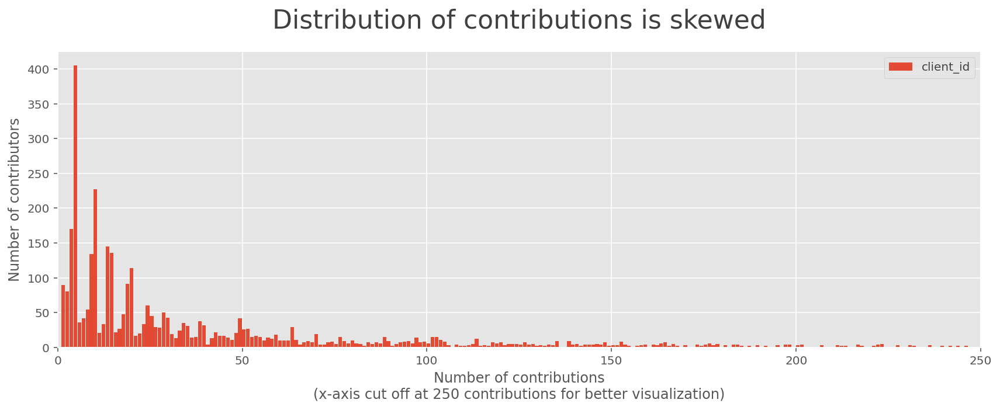

In [13]:
# plot histogram by leaving out the top 100 contributors, since I only show contributions of 250 recordings or less
df.client_id.value_counts()[200:].to_frame().plot(kind="hist", bins=300, rwidth=.9)
plt.title("Distribution of contributions is skewed", size=TITLE_SIZE, pad=20)
plt.xlim(0, 250)
plt.xlabel(f"Number of contributions\n(x-axis cut off at 250 contributions for better visualization)")
plt.ylabel(f"Number of contributors")
plt.tight_layout()
plt.show()

## Observations from `gender`
- The data set contains **380k recordings from men vs. 52k from women**.
- **The data set is strongly biased towards male voices.** Just around 12% of the files are spoken by women.
- We have a total of **around 3'200 unique male voices versus around 500 unique female voices**.
- **Men have recorded way more samples per person** – on average 102 samples vs. just 14 per unique female client id.

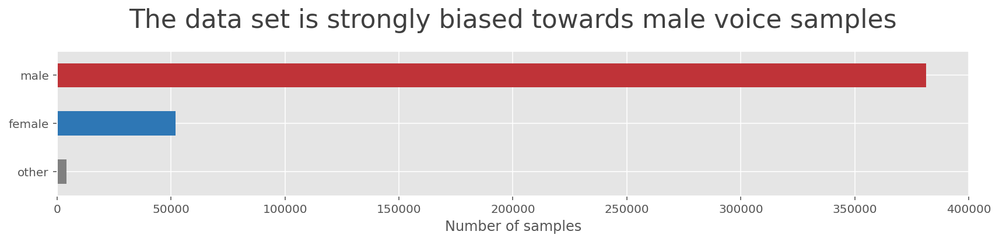

Count of samples per gender
          total count    percentage %
------  -------------  --------------
male           381166      0.871647
female          52075      0.119085
other            4053      0.00926836

Count of unique voices per gender
------  ----
male    3201
female   508
other     41
------  ----

Average recordings per contributor
------  ---
male    102
female   14
other     1
------  ---


In [14]:
gender = df.gender.value_counts().to_frame()
gender_perc = df.gender.value_counts(normalize=True)
tmp = pd.concat([gender, gender_perc], axis=1)
tmp.columns = ["total count", "percentage %"]

plt.figure(figsize=(12,3))
tmp.iloc[::-1]["total count"].plot.barh(color=["grey", COLOR_FEMALE, COLOR_MALE])
plt.title("The data set is strongly biased towards male voice samples", size=TITLE_SIZE, pad=20)
plt.xlabel(f"Number of samples")
plt.tight_layout()
plt.show()

print("Count of samples per gender")
print(tabulate(tmp, headers="keys"))
print()

tmp2 = df.groupby("client_id").head(1).gender.value_counts().to_frame()
print("Count of unique voices per gender")
print(tabulate(tmp2))
print()

mean_recordings = df.groupby(["gender", "client_id"]).client_id.count().unstack(level=0, fill_value=0).mean().to_frame()
print("Average recordings per contributor")
print(tabulate(mean_recordings.reindex(tmp2.index), floatfmt=".0f"))

- By manually examining samples from label `other` I see that these just seem regular recordings from women, men and teens. 
- Since we want to predict on **biological** sex I decide to remove these samples.

In [15]:
to_drop = df[df.gender=="other"].index
df.drop(to_drop, inplace=True)
df.reset_index(drop=True, inplace=True)

## Observations from `age`
- The mayority of samples has been recorded by people in the age range between 20 and 60 (the age is recorded in decades rather than exact ages). 

,samples,samples %
10.0,19053,0.044095
20.0,124742,0.288692
30.0,92497,0.214067
40.0,117043,0.270875
50.0,62996,0.145793
60.0,14359,0.033231
70.0,1322,0.003060
80.0,31,0.000072
90.0,50,0.000116


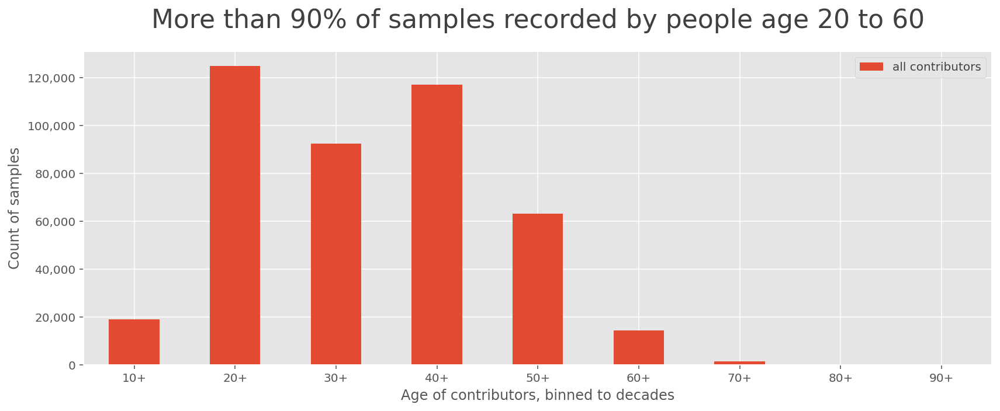

In [16]:
age = df.age.value_counts().to_frame()
age_perc = df.age.value_counts(normalize=True)
tmp = pd.concat([age, age_perc], axis=1)
tmp.columns = ["samples", "samples %"]
tmp.sort_index(inplace=True)
display(tmp)

plt.figure(figsize=(12,5))
ax = tmp.samples.plot.bar()
plt.title("More than 90% of samples recorded by people age 20 to 60", size=TITLE_SIZE, pad=20)
plt.xticks(rotation=0)
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, y: f'{(x+1)*10}+'))
ax.yaxis.set_major_formatter(FuncFormatter(lambda x, _: f'{x:,.0f}'))
plt.xlabel(f"Age of contributors, binned to decades")
plt.ylabel("Count of samples")
plt.legend(["all contributors"])
plt.tight_layout()
plt.show()

- **The contributing men are mostly younger than the contributing women.** 
- The average age of men is 32.4 vs. 37 for women (keeping in mind here that I don't have true continuous age values in the data but only binned ones to decades).

gender      mean
--------  ------
female      37.0
male        32.4



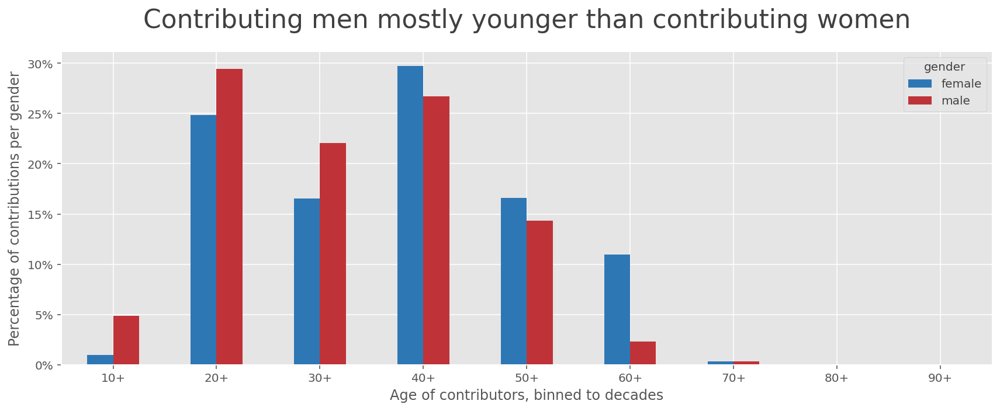

In [17]:
print(tabulate(df.groupby("gender").age.agg(["mean"]), floatfmt=".1f", headers="keys"))
print()

age = df.groupby("gender").age.value_counts(normalize=True).to_frame()
age = age.unstack(level=0, fill_value=0)
age.columns = age.columns.droplevel(0)
age.index.name = None

ax = age.plot.bar(figsize=(12,5), color=[COLOR_FEMALE, COLOR_MALE])
plt.title("Contributing men mostly younger than contributing women", size=TITLE_SIZE, pad=20)
plt.xticks(rotation=0)
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, y: f'{(x+1)*10}+'))
plt.xlabel(f"Age of contributors, binned to decades")
ax.yaxis.set_major_formatter(PercentFormatter(xmax=1, decimals=0))
plt.ylabel("Percentage of contributions per gender")
plt.tight_layout()
plt.show()

Since **gender in voice is accurately only distinguishable after puberty** and not many teens likely will be featured in the mayority of podcasts **I decide to remove all teens from the data set.**

In [18]:
to_drop = df[df.age==10].index
df.drop(to_drop, inplace=True)
df.reset_index(drop=True, inplace=True)

## Observations from `accent`
- By far the most samples were recorded by people labeled as Germans. 
- It's helpful that we have at least a variety of accents. I imagine training on this diversity will help the model to better generalize.
- From manually examining samples with accent label «switzerland» I gather that some of these (but not all) are from Swissgerman speakers who have recorded their samples in Highgerman.

In [19]:
print("Percentage of Top 10 accents in data set")
print(tabulate(df.accent.value_counts(normalize=True)[:10].to_frame(), floatfmt=".4f"))

Percentage of Top 10 accents in data set
--------------  ------
germany         0.9322
austria         0.0362
switzerland     0.0206
france          0.0035
italy           0.0025
russia          0.0023
other           0.0007
united_states   0.0005
united_kingdom  0.0004
greece          0.0002
--------------  ------


## Observations from `word_count`
- Most of the spoken samples consist of 4 to 14 words. 
- I decide to remove very short samples of 3 words or less in order to avoid non typical utterances not similar to the continuous conversation I will have in podcasts.

In [20]:
print("Word count and number of samples")
print(tabulate(df.word_count.value_counts().sort_index().to_frame()))

Word count and number of samples
--  -----
 1   4688
 2   5094
 3   8559
 4  20770
 5  33452
 6  47660
 7  47811
 8  45482
 9  44024
10  39491
11  34981
12  31006
13  25891
14  21287
15   1354
16   1075
17    703
18    395
19    270
20     65
21     97
22     33
--  -----


After cleaning and filtering I have around 395k samples left from the initial 565k.

In [21]:
to_drop = df[df.word_count<=3].index
df.drop(to_drop, inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 395847 entries, 0 to 414187
Data columns (total 6 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   client_id   395847 non-null  int64  
 1   path        395847 non-null  object 
 2   age         394774 non-null  float64
 3   gender      395847 non-null  object 
 4   accent      359607 non-null  object 
 5   word_count  395847 non-null  int64  
dtypes: float64(1), int64(2), object(3)
memory usage: 21.1+ MB


## Final preparation of metadata

In order to make data preparation and experimentation as easy as possible I combine all previous cleaning and transformation steps into one reusable function.

In addition to the previous processing steps:
- **I balance out female and male voices.**
- I filter the data so that I **get as many different voices as possible and not overweigh heavy contributors**. 

My intuition is that the model needs to be trained on a spectrum of people that is as wide and varied as possible in order to generalize to new / unheard voices.  

In [22]:
def sample_contributors(data, max_samples_per_contributor=100):
    # I set max_samples_per_contributor=100 because this is the average contribution per male client_id (vs just 14 for women)
    # I aim for a filtered data set which is as varied as possible and I try minimize the skew towards heavy contributors
    g = data.groupby("client_id")
    tmp = []
    for _, data in g:
        if len(data) > max_samples_per_contributor:
            tmp.append(data.sample(max_samples_per_contributor, random_state=42))
        else:
            tmp.append(data)
    tmp = pd.concat(tmp)
#     tmp = tmp.reset_index(drop=True)
    return tmp
    
    
def prepare_metadata(df_):
    # drop all samples where label for target variable is missing
    df_.dropna(subset=["gender"], inplace=True)

    # simplify client_id
    mapping = dict(zip(df_.client_id.unique(), range(df_.client_id.nunique())))
    df_.client_id = df_.client_id.map(mapping)

    # map textual values for age to integers
    ages = ['teens', 'twenties', 'thirties', 'fourties', 'fifties', 'sixties',
           'seventies', 'eighties', 'nineties']
    ages_int = range(10, 100, 10)
    mapping = dict(zip(ages, ages_int))
    df_.age = df_.age.map(mapping)

    # get word_count as rough measure of recording length
    df_["word_count"] = df_.sentence.apply(lambda x: len(str(x).split()))

    # drop features that that I do not need
    df_.drop(["sentence", "segment", "locale", "up_votes", "down_votes"], axis=1, inplace=True)

    # drop gender «other» because ambiguous what that entails
    to_drop = df_[df_.gender=="other"].index
    df_.drop(to_drop, inplace=True)
    
    # remove samples with three words or less
    to_drop = df_[df_.word_count<=3].index
    df_.drop(to_drop, inplace=True)

    # drop recordings from teens because gender in that age is hard to distinguish
    to_drop = df_[df_.age==10].index
    df_.drop(to_drop, inplace=True)
    
    df_.reset_index(drop=True, inplace=True)
    
    # split male and female
    female = df_[df_.gender=="female"].copy()
    male = df_[df_.gender=="male"].copy()
    
    # reduce female samples to a max count of 100 per contributor to reduce bias towards heavy contributors
    female = sample_contributors(female, max_samples_per_contributor=100)
    male = sample_contributors(male, max_samples_per_contributor=100)

    # sample from men as many samples as I have female samples
    # again make sure that I include all voices and reduce bias towards men that have contributed heavily
    sampled_ids = []
    while len(sampled_ids)<len(female):
        idx = male.groupby("client_id").sample(1).index
        sampled_ids.extend(idx)
        male.drop(idx, inplace=True)
    male = df_.iloc[sampled_ids].copy()
    # reduce male samples to exact the sample size that we have for females
    male = male.sample(len(female), random_state=42)
    df_ = pd.concat([male, female])
        
    # add boolean for gender
    df_["man"] = np.where(df_.gender=="male", True, False)
    
    df_.reset_index(drop=True, inplace=True)
    
    return df_

Processing the metadata…

In [23]:
%%time
languages = ["_german"]
frames = []

for language in languages:
    tmp = pd.read_csv(f"_data/CommonVoice/{language}/validated.tsv", sep="\t")
    tmp["language"] = language
    frames.append(prepare_metadata(tmp))

df_meta = pd.concat(frames)
df_meta.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35122 entries, 0 to 35121
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   client_id   35122 non-null  int64  
 1   path        35122 non-null  object 
 2   age         34914 non-null  float64
 3   gender      35122 non-null  object 
 4   accent      28022 non-null  object 
 5   language    35122 non-null  object 
 6   word_count  35122 non-null  int64  
 7   man         35122 non-null  bool   
dtypes: bool(1), float64(1), int64(2), object(4)
memory usage: 1.9+ MB
CPU times: user 6.25 s, sys: 109 ms, total: 6.36 s
Wall time: 6.35 s


After processing **and balancing the data set towards gender parity** I have around 35k samples left.

In [24]:
print("Samples per gender")
print(tabulate(df_meta.gender.value_counts().to_frame()))

Samples per gender
------  -----
male    17561
female  17561
------  -----


**There still is a substantial gender imbalance in the data in terms of voice variety**. 
- There are **many more unique male voices in the data set than unique female ones.** 
- The precision of a trained model might therefore be better for men than for woman. 

Nonetheless I keep the data like that and might reconsider again after training and evaluating the first models.

In [25]:
print("Number of unique voices per gender")
print(tabulate(df_meta.groupby("gender").client_id.nunique().to_frame()))

Number of unique voices per gender
------  ----
female   462
male    2777
------  ----


On the other hand **the substantial gender imbalance of the average count of recordings per contributor now is equalized.**

In [26]:
mean_recordings = df_meta.groupby(["gender", "client_id"]).client_id.count().unstack(level=0, fill_value=0).mean().to_frame()
print("Average recordings per contributor")
print(tabulate(mean_recordings, floatfmt=".0f"))

Average recordings per contributor
------  -
female  5
male    5
------  -


By comparing the age distribution of the full data set versus the final and filtered data **I see that the age gap between male and female contributors now is more balanced.**

In [27]:
print("Age distribution per gender:\n")
print("-> full data set")
print(tabulate(df.groupby("gender").age.agg(["mean", "median"]), floatfmt=".1f", headers="keys"))
print()
print("-> filtered and final data set")
print(tabulate(df_meta.groupby("gender").age.agg(["mean", "median"]), floatfmt=".1f", headers="keys"))

Age distribution per gender:

-> full data set
gender      mean    median
--------  ------  --------
female      37.3      40.0
male        33.6      30.0

-> filtered and final data set
gender      mean    median
--------  ------  --------
female      34.5      30.0
male        32.1      30.0


# 2) Exploration of audio features

From research I gather that there are three promising features that I can extract from audio samples in regard to speech analysis:
- The **fundamental frequency FO**
- **Linear spectrograms** from a Short-time Fourier transform (STFT)
- **Mel spectrograms** and **Mel-frequency cepstral coefficients** (MFCCs)

The [Librosa package](https://librosa.org/doc/main/index.html) can extract all of these features. I will examine these key features and evaluate the correlation to the target variable of gender. 

First I load one male and female audio sample of the same text from CommonVoice.

In [28]:
# sentence = 'Brüssel ist die Hauptstadt von Belgien.'
# df[df.sentence==sentence].groupby("gender").sample(1, random_state=42)

In [29]:
female = '_data/CommonVoice/_german/clips/common_voice_de_17886634.mp3'
male = '_data/CommonVoice/_german/clips/common_voice_de_18388988.mp3'

Quickly checking the audio inline in the notebook...

In [30]:
display(ipd.Audio(female))
display(ipd.Audio(male))

Librosa unfortunately loads audio files quite slowly. Though this doesn't matter for single files it definitely will hurt performance when extracting features of tens of thousands of samples. 

[pydub](https://github.com/jiaaro/pydub) is a much faster alternative that I will use from here on. 

In [31]:
SAMPLE_RATE = 48_000 # CommonVoice samples have a fixed sample rate of 48kHz

# https://stackoverflow.com/questions/29547218/remove-silence-at-the-beginning-and-at-the-end-of-wave-files-with-pydub
def detect_leading_silence(sound, silence_threshold=-50.0, chunk_size=10):
    trim_ms = 0 # ms
    assert chunk_size > 0 # to avoid infinite loop
    while sound[trim_ms:trim_ms+chunk_size].dBFS < silence_threshold and trim_ms < len(sound):
        trim_ms += chunk_size
    return trim_ms

def load_with_pydub(file_path, normalize=False, strip_silence=False):
    audio = AudioSegment.from_file(file_path)
    audio = audio.set_frame_rate(SAMPLE_RATE)
    
    if normalize==True:
        audio = effects.normalize(audio)  
    
    if strip_silence==True:
        start_trim = detect_leading_silence(audio)
        end_trim = detect_leading_silence(audio.reverse())
        audio_duration = len(audio) 
        audio = audio[start_trim:audio_duration-end_trim]
    
    audio = np.array(audio.get_array_of_samples(), dtype=np.float32)
    
    return audio

def plot_audio_waveform(gender, audio):
    plt.figure(figsize=(12,4))
    librosa.display.waveplot(audio, sr=SAMPLE_RATE)
    plt.title(f"{gender} voice", size=24, pad=20)
    plt.xlim(0,4)
    plt.ylim(-40_000, 40_000)
    plt.tight_layout()
    plt.show()

From the plot I observe what I could already hear from listening to the two samples:
- The samples have **different lengths, waveform** and **amplitude**.
- There is **substantial silence at beginning and end of the recording**.

This will very likely be true for all our samples. Therefore **I need to normalize the samples and remove the leading and trainling silence.**

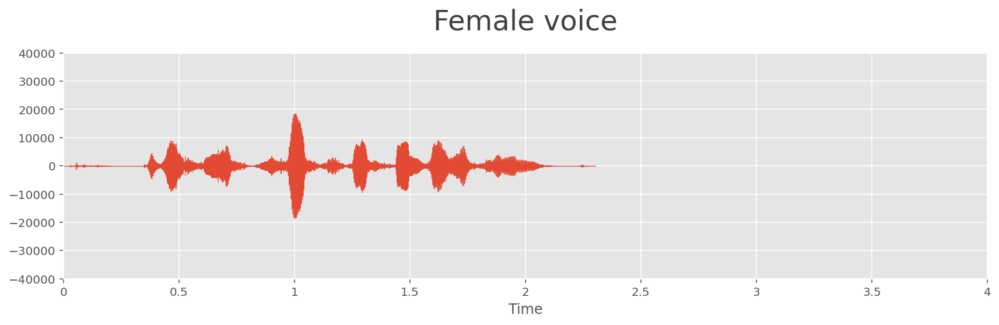

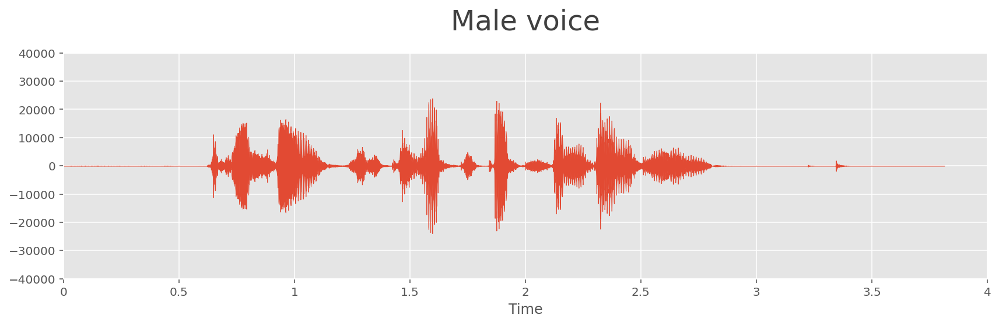

In [32]:
audio_female = load_with_pydub(female)
audio_male = load_with_pydub(male)
   
plot_audio_waveform("Female", audio_female)
plot_audio_waveform("Male", audio_male)

After normalization and stripping the silence both samples can be compared more accurately.

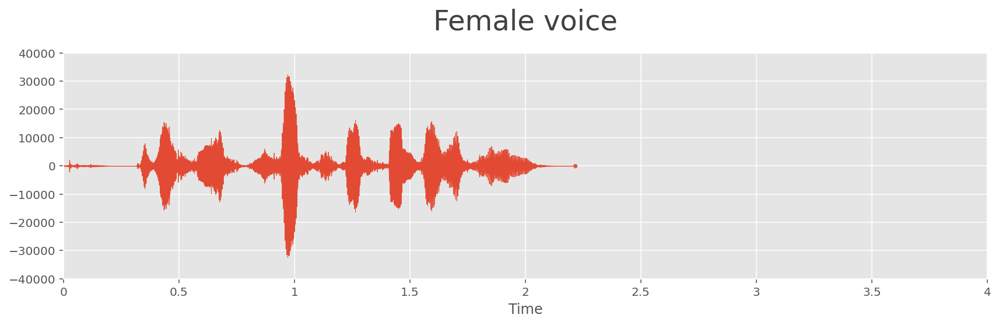

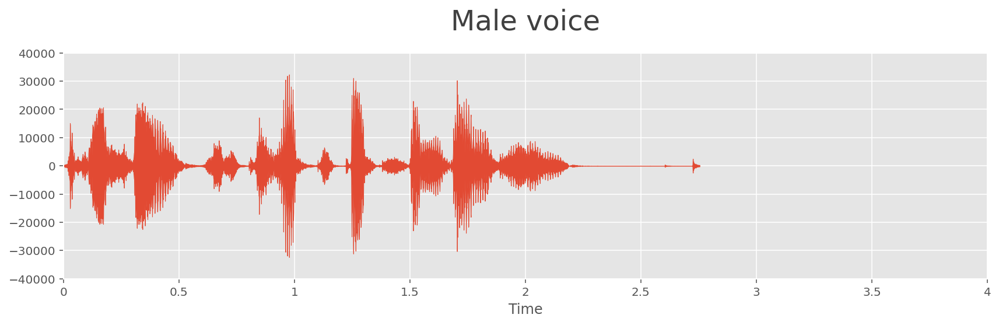

In [33]:
audio_female = load_with_pydub(female, normalize=True, strip_silence=True)
audio_male = load_with_pydub(male, normalize=True, strip_silence=True)
   
plot_audio_waveform("Female", audio_female)
plot_audio_waveform("Male", audio_male)

## Spectrogram from Short-time Fourier transform (STFT)
A **spectrogram** from a Short-time Fourier transform (STFT) is a visual representation of the amplitude of frequencies the signal has. The vertical axis represents the frequency spectrum, the horizontal axis is the time axis. 
- From the plots I can clearly observe that **the male voice sample has a much more pronounced amplitude in the lower frequency spectrum.**

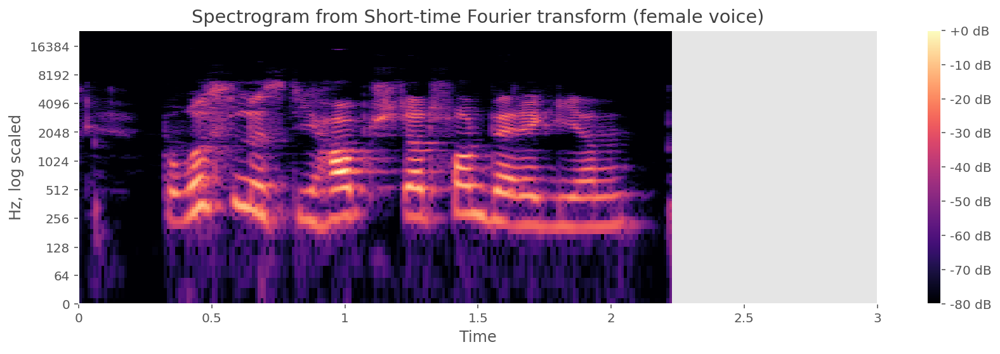

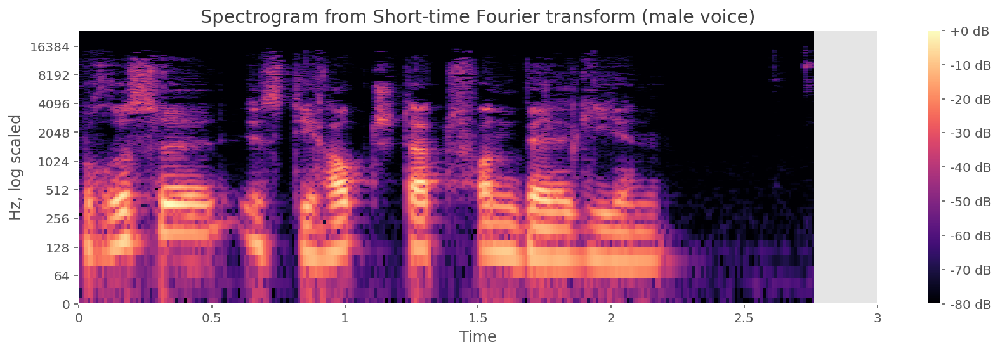

In [34]:
for gender, audio in zip(["female", "male"], [audio_female, audio_male]):
    # Short-time Fourier Transform
    X = np.abs(librosa.stft(audio))
    # Convert the spectrogram to a logarithmic dB-scaled spectrogram
    # Also normalize the spectrogram so that its maximum represents the 0 dB point.
    X = librosa.amplitude_to_db(X, ref=np.max)
    
    plt.figure(figsize=(12,4))
    librosa.display.specshow(X, sr=SAMPLE_RATE, x_axis='time', y_axis='log', 
                            norm=Normalize(vmin=-80, vmax=0)
                            )
    plt.colorbar(format='%+2.0f dB')
    plt.ylabel('Hz, log scaled')
    plt.title(f"Spectrogram from Short-time Fourier transform ({gender} voice)")
    plt.xlim(0, 3)
    plt.tight_layout()
    plt.show()

## Mel spectrogram

**Mel spectrograms** are based on the [mel scale](https://en.wikipedia.org/wiki/Mel_scale) which is a non-linear transformation of frequency scale **based on the human perception of pitches**. The mel scale is calculated so that two pairs of frequencies separated by a delta in the mel scale are perceived by humans as having the same perceptual difference.
- From the mel spectrogram I can clearly observe the same as from the linear spectrogram: **The male voice has more amplitude in the lower frequencies.**

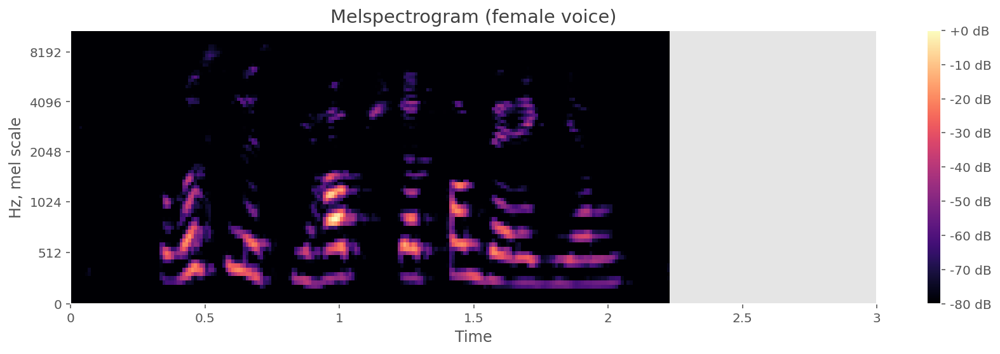

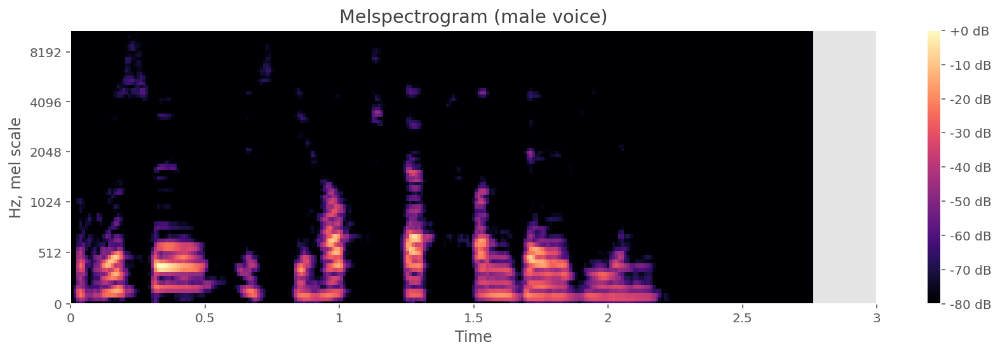

In [35]:
for gender, audio in zip(["female", "male"], [audio_female, audio_male]):
    X = librosa.feature.melspectrogram(audio, sr=SAMPLE_RATE, n_mels=80, fmax=8000)
    X = librosa.amplitude_to_db(np.abs(X), ref=np.max)

    plt.figure(figsize=(12,4))
    librosa.display.specshow(X, sr=SAMPLE_RATE, x_axis='time', y_axis='mel')
    plt.colorbar(format='%+2.0f dB')
    plt.ylabel('Hz, mel scale')
    plt.title(f"Melspectrogram ({gender} voice)")
    plt.xlim(0, 3)
    plt.tight_layout()
    plt.show()

## Mel-frequency cepstral coefficients (MFCCs)

**MFCCs are an alternative representation of the Mel-frequency spectrogram** often used in audio applications. The MFCCs are calculated by applying the [discrete cosine transform (DCT)](https://en.wikipedia.org/wiki/Discrete_cosine_transform) to a mel-frequency spectrogram.

- Plotting the MFCCs of the two test samples **clearly shows again the higher intensity in higher frequency bands of the female voice.**

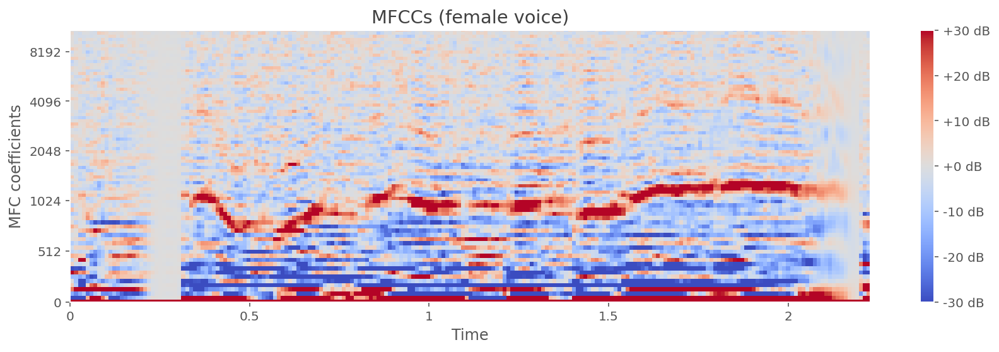

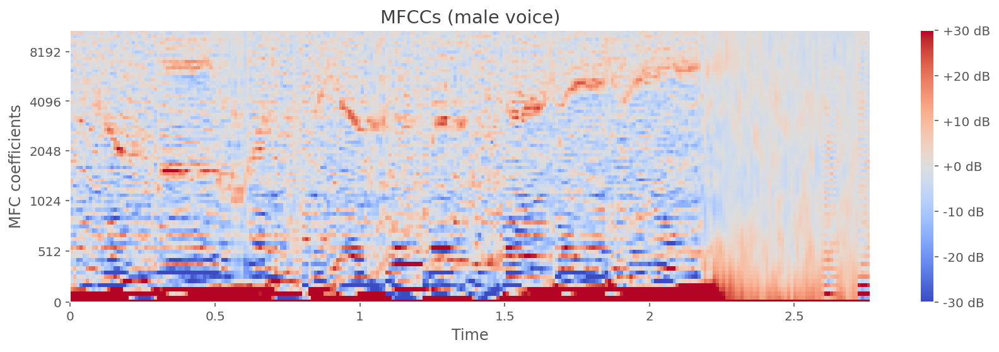

In [36]:
for gender, audio in zip(["female", "male"], [audio_female, audio_male]):
    X = librosa.feature.mfcc(audio, sr=SAMPLE_RATE, n_mfcc=80, fmin=0, fmax=8000)
    plt.figure(figsize=(12,4))
    librosa.display.specshow(X, sr=SAMPLE_RATE, x_axis='time', y_axis="mel", norm=Normalize(vmin=-30, vmax=30))
    plt.colorbar(format='%+2.0f dB')
    plt.ylabel('MFC coefficients')
    plt.title(f'MFCCs ({gender} voice)')
    plt.tight_layout()
    plt.show()

## Fundamental frequency FO

The [fundamental frequency FO](https://en.wikipedia.org/wiki/Fundamental_frequency) is an important metric in language research and speech processing. It differs between man and woman and will likely be a strong feature for gender prediction. 

I extract the FO for the two samples and print out the average. **The mean FO of the female voice is much higher than the FO for the male voice.**

In [37]:
fO_female, _, _ = librosa.pyin(audio_female, fmin=10, fmax=1500)
fO_male, _, _ = librosa.pyin(audio_male, fmin=10, fmax=1500)

# Return an array of time values to match the time axis from a feature matrix.
timevals_female = librosa.times_like(fO_female)
timevals_male = librosa.times_like(fO_male)

In [38]:
fO_female_mean = np.nanmean(fO_female)
fO_male_mean = np.nanmean(fO_male)

print(f"Mean fundamental frequency FO:\n- {fO_female_mean:.0f} Hz for the female voice\n-  {fO_male_mean:.0f} Hz for the male voice")

Mean fundamental frequency FO:
- 145 Hz for the female voice
-  53 Hz for the male voice


Plotting the FO values over time confirms the observation. The FO (purple line) is higher for the female voice recording.

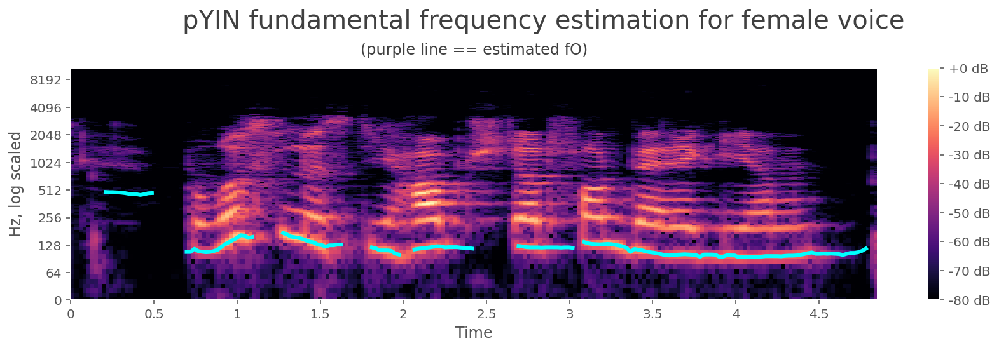

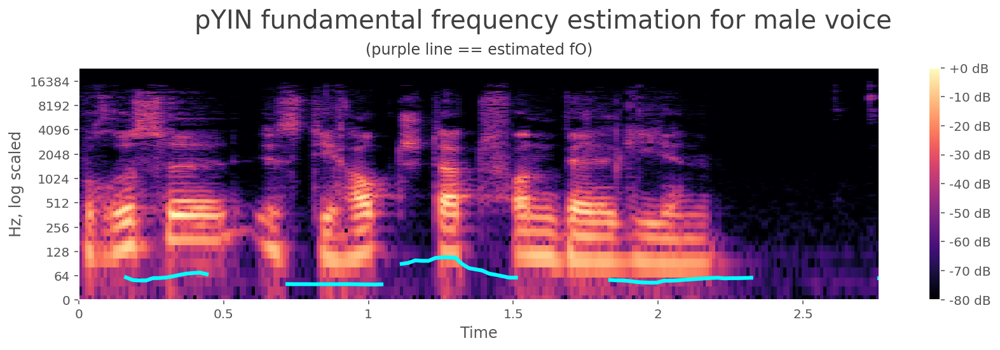

In [39]:
X = np.abs(librosa.stft(audio_female))
X = librosa.amplitude_to_db(X, ref=np.max)

plt.figure(figsize=(12,4))
librosa.display.specshow(X, x_axis='time', y_axis='log')
plt.plot(timevals_female, fO_female, label='f0', color='cyan', linewidth=3)
plt.colorbar(format='%+2.0f dB')
plt.ylabel('Hz, log scaled')
plt.suptitle('pYIN fundamental frequency estimation for female voice', fontsize=20, y=0.95)
plt.title(f"(purple line == estimated fO)\n", size=12, y=0.95)
plt.tight_layout()
plt.show()

X = np.abs(librosa.stft(audio_male))
X = librosa.amplitude_to_db(X, ref=np.max)

plt.figure(figsize=(12,4))
librosa.display.specshow(X, sr=SAMPLE_RATE, x_axis='time', y_axis='log')
plt.plot(timevals_male, fO_male, label='f0', color='cyan', linewidth=3)
plt.colorbar(format='%+2.0f dB')
plt.ylabel('Hz, log scaled')
plt.suptitle('pYIN fundamental frequency estimation for male voice', fontsize=20, y=0.95)
plt.title(f"(purple line == estimated fO)\n", size=12, y=0.95)
plt.tight_layout()
plt.show()

## Conclusions from preliminary feature extraction
- **I observe that all three extracted features have a correlation to the target.** 
- **Since I only used two samples this supposed correlation is absolutely anecdotal.** Other samples might indicate something different. I **therefore have to verify this with a representative amount of samples in the next step.**
- **I suppose that it makes sense to use statistics (like mean, median, standard deviation) from the time based features rather than using e.g. an MFCC as a whole.** I aim for a representation of the voice characteristic regardless of the length of the sample and the particular words that were spoken. Therefore I want to get variations in time and length out of the equation. This likely would be different if I were to use sequential models rather than e.g. Logistic regression or a non-sequential DNN.
- Another finding: librosa unfortunately takes very long calculating the fundamental frequency. I will use [aubio](https://github.com/aubio/aubio) instead which is much faster.

# 3) CommonVoice: EDA audio features

## Evaluating FO as a feature

### Extracting FO
To prepare the data:
- I extract the fundamental frequency FO for each sample.
- I refine and filter the results and calculate mean, median, standard deviation as well as min/max values.

In [40]:
def calculate_fundamental_frequency(data, language):
    BASE_PATH = f"_data/CommonVoice/{language}/clips/"
    # instantiate aubio pitch processer with "yin" algorithm for FO calculation
    pitch_o = pitch("yin")
    hop_s = 256
    
    results = []
    for file in tqdm(data.path):
        full_path = BASE_PATH + file
        s = source(full_path)
        pitches = []
        while True:
            samples, read = s()
            pitch_ = pitch_o(samples)[0]
            confidence = pitch_o.get_confidence()
            # remove all pitch predictions below confidence 0.8
            # I have taken this threshold from the aubio example script from GitHub
            if confidence < 0.8: 
                pitch_ = 0.
            pitches.append(pitch_)
            if read < hop_s: 
                break
        results.append(pitches)    
    return results


# pitch predictions beyond 1_500 Hz are likely wrong / useless for speech analysis
FO_CUTOFF_UPPER = 1_500 

def get_stats_from_fO(fO):
    fO = [0.0 if x>FO_CUTOFF_UPPER else x for x in fO]
    fO = [x for x in fO if x!=0.0]
    # samples of very low quality or amplitude result in empty lists after cleaning
    # catch these cases and return NaNs
    if len(fO)==0:
        return (None, None, None, None, None)    
    return (np.mean(fO), np.median(fO), np.std(fO), np.min(fO), np.max(fO))


def extract_fO(data_, language="_german"):
    results = calculate_fundamental_frequency(data_, language=language)
    fO_results = [get_stats_from_fO(x) for x in results]
    df_fO = pd.DataFrame(fO_results, columns=["fO_mean", "fO_median", "fO_std", "fO_min", "fO_max"])
    return df_fO

In [41]:
# # reload and prepare metadata, extract FO and save features
# language = ["_german"]
# tmp = pd.read_csv(f"_data/CommonVoice/{language}/validated.tsv", sep="\t")
# df_meta = prepare_metadata(tmp)
# base_path = f"_data/CommonVoice/{language}/clips/"
# df_fO = extract_fO(df_meta, language=language)
# df_fO.to_parquet(f"_saved_features/cv_{language}_fO.parq")

In [42]:
# reload saved features
languages = ["_german"]
df_fO = pd.read_parquet(f"_saved_features/_features_step01/cv_{language}_fO.parq")
df_fO["man"] = df_meta.man
cols = ["man", "fO_mean", "fO_median", "fO_std", "fO_min", "fO_max"]
df_fO = df_fO[cols] 

### Examining FO
- As expected **the mean, median, min, max FOs of female voices are higher than those of men.**
- The standard deviation is slightly higher for men.  


In [43]:
print("Statistics for FO by gender")
tmp = df_fO.groupby("man").agg("mean").T
tmp.columns = ["female", "male"]
print(tabulate(tmp, headers="keys", floatfmt=".0f"))

Statistics for FO by gender
             female    male
---------  --------  ------
fO_mean         190     130
fO_median       182     115
fO_std           56      59
fO_min          100      90
fO_max          536     484


**The distribution of the statistic values is quite skewed.** I will try to **log scale the values for training** to see if it improves the accuracy.

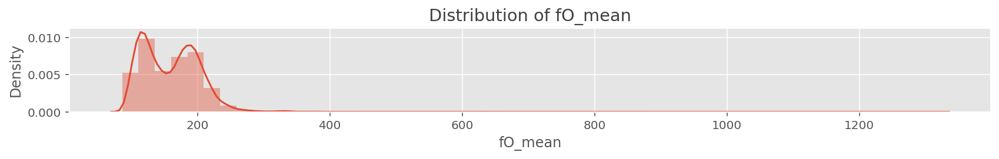

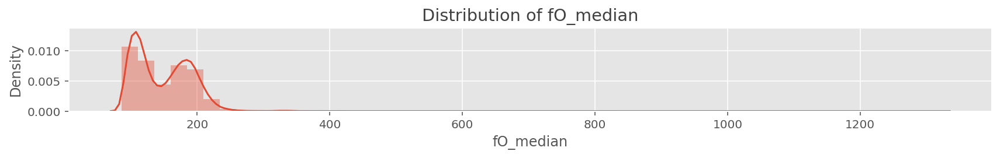

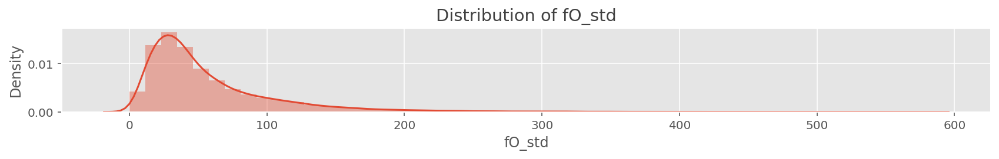

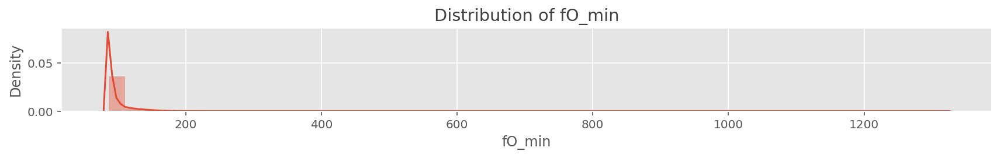

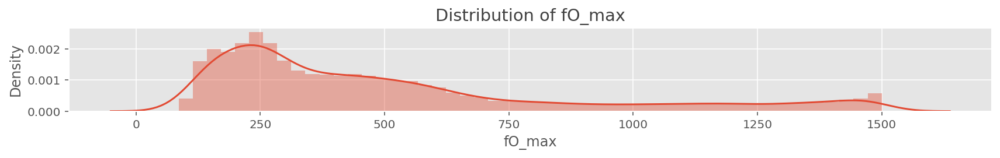

In [44]:
for col in df_fO.iloc[:, 1:]:
    plt.figure(figsize=(12,2))
    sns.distplot(df_fO[col])
    plt.title(f"Distribution of {col}")
    plt.tight_layout()
    plt.show()

By calculating the correlations of FO and target variable and plotting these as a heatmap I gather this:
- **The mean/median of the audio's fundamental frequency is strongly correlated to the target.**
- The median is significantly higher correlated than the mean (-0.74 vs. -0.67).
- **The minimum value is weakly to moderately correlated** and might be useful too.
- **Standard deviation and the max values lack meaningful correlation** and likely won't be usable.

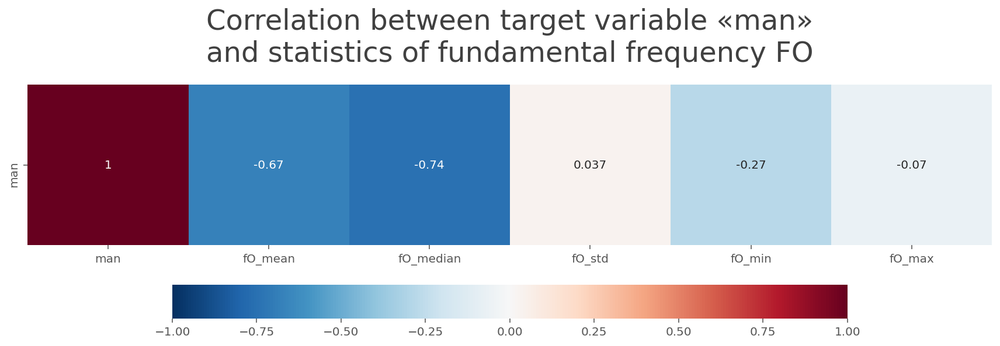

In [45]:
corr = df_fO.corr()
plt.figure(figsize=(12,12))
sns.heatmap(corr.iloc[0,:].to_frame().T,
            cmap="RdBu_r", 
            annot=True, 
            square=True,
            vmin=-1,
            vmax=1, 
            cbar_kws={"shrink": .7, "orientation":"horizontal", "pad":0.04},)
plt.title("Correlation between target variable «man»\nand statistics of fundamental frequency FO", size=24, pad=20)
plt.tight_layout()
plt.show()

From the distributions of the various statistics I observe:
- **There is a substantial difference between the FO of female vs male voices.** Women on average have higher pitched voices. 
- **There are outliers visible that I possibly have to remove before training.** The plots can serve as a reference for manually setting limits to cutoff outliers.
- As to be expected: The distribution of median values is more robust towards outliers and might prove more useful as a feature. 

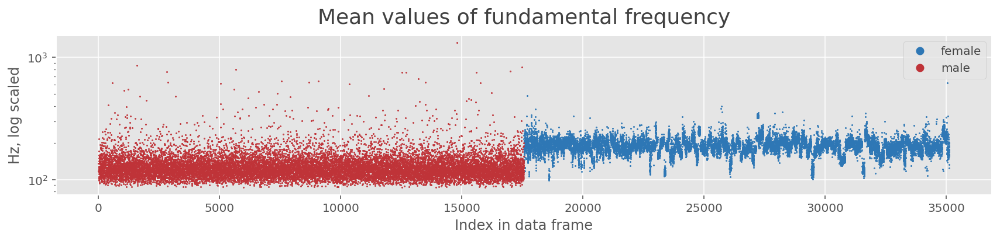

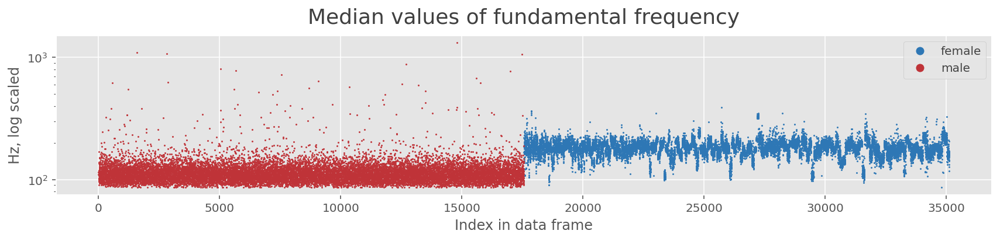

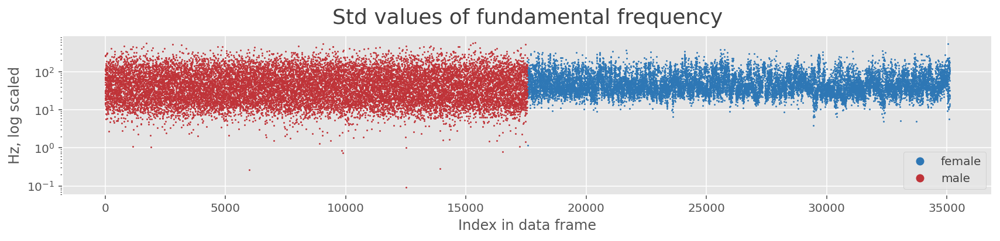

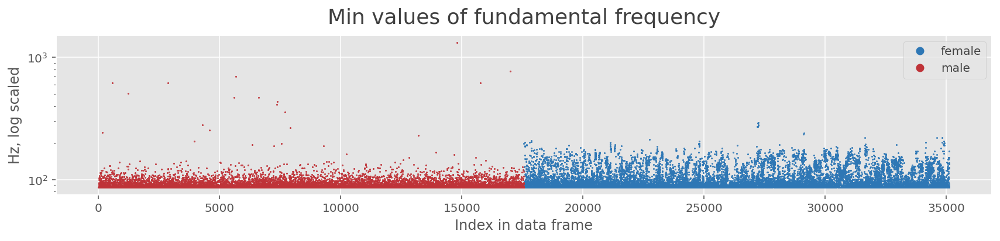

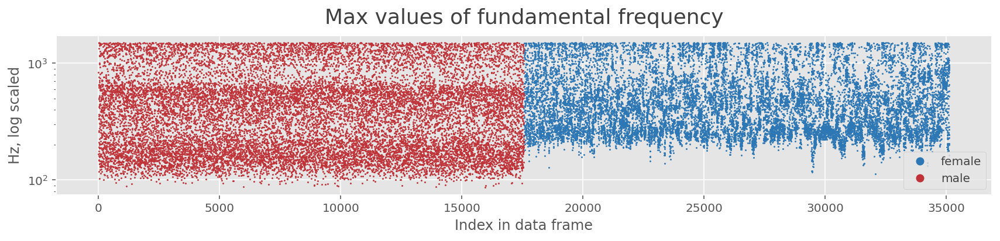

In [46]:
for col in df_fO.columns[1:]:
    plt.figure(figsize=(12,3))
    df_fO[col].iloc[17561:].plot(lw=0, marker='.', color=COLOR_FEMALE, markersize=1, logy=True)
    df_fO[col].iloc[:17561].plot(lw=0, marker='.', color=COLOR_MALE, markersize=1, logy=True)
    plt.title(f"{col.replace('fO_','').capitalize()} values of fundamental frequency", size=18, pad=10)
    plt.xlabel("Index in data frame")
    plt.ylabel("Hz, log scaled")
    plt.legend(["female", "male"], markerscale=12)
    plt.tight_layout()
    plt.show()

## Evaluating spectrograms and MFCCs as features

### Extracting STFT and MFCC
To make further exploration easier I create reusable functions for the extraction of these features.

In [47]:
# I extract MFCCs between 60 and 8000 Hz, it's unlikely to get much signal for speech below and above this range
# https://en.wikipedia.org/wiki/Voice_frequency
# CommonVoice audio files are sampled at 48 kHz which gives us clean multiples (6 * 8 kHz max == 48 kHz)
# I extract 80 mel bands to achieve enough granularity
SAMPLE_RATE = 48_000
MFCC_MIN_FREQUENCY = 60
MFCC_MAX_FREQUENCY = 8_000
MFCC_BANDS = 80


# https://stackoverflow.com/questions/38015319/how-to-create-a-numpy-array-from-a-pydub-audiosegment
def pydub_to_np(audio):
    return np.array(audio.get_array_of_samples(), 
                    dtype=np.float32).reshape((-1, audio.channels)).T, audio.frame_rate


# https://stackoverflow.com/questions/29547218/remove-silence-at-the-beginning-and-at-the-end-of-wave-files-with-pydub
def detect_leading_silence(sound, silence_threshold=-50.0, chunk_size=10):
    trim_ms = 0 # ms
    assert chunk_size > 0 # to avoid infinite loop
    while sound[trim_ms:trim_ms+chunk_size].dBFS < silence_threshold and trim_ms < len(sound):
        trim_ms += chunk_size
    return trim_ms


def get_features(file):
    audio_file = AudioSegment.from_file(file)
    
    # make sure all files are processed in same frame rate
    audio_file = audio_file.set_frame_rate(SAMPLE_RATE)
    
    # normalize audio levels
    audio_file = effects.normalize(audio_file)  
    
    # remove silence at beginning and end
    start_trim = detect_leading_silence(audio_file)
    end_trim = detect_leading_silence(audio_file.reverse())
    audio_duration = len(audio_file) 
    audio_file = audio_file[start_trim:audio_duration-end_trim]
    
    # extract features from a fixed segment of 2 seconds from the center of remaining audio file
    # tests with 1, 2, 3, 4, 5 secs and full length feature extraction showed that 2 secs. yields best accuracy
    SECONDS_TO_PROCESS = 2
    if audio_file.duration_seconds > SECONDS_TO_PROCESS:
        # pydub does things in milliseconds
        ms_to_process = SECONDS_TO_PROCESS*1000
        center_of_audio = len(audio_file)/2 
        start_extract = center_of_audio - ms_to_process/2 
        end_extract = start_extract + ms_to_process
        audio_file = audio_file[start_extract:end_extract]
        
    waveform, sample_rate = pydub_to_np(audio_file)
    assert sample_rate == SAMPLE_RATE
    
    if waveform.ndim == 2: # check if file is stereo 
        waveform = waveform.mean(axis=0) # if stereo merge channels by averaging
        
    # extract an STFT spectrogram and calculate the mean
    # n_fft=512 recommended in librosa docs for speech processing rather than default 2048
    X = librosa.stft(waveform, n_fft=2048)
    X = librosa.amplitude_to_db(np.abs(X))
    stft_ = np.mean(X, axis=1)
    
    # extract an MFCC and calculate the mean 
    mfcc_ = np.mean(librosa.feature.mfcc(y=waveform, sr=SAMPLE_RATE, 
                                         n_mfcc=MFCC_BANDS, 
                                         fmin=MFCC_MIN_FREQUENCY,
                                         fmax=MFCC_MAX_FREQUENCY,
                                        ), axis=1) 
   
    return np.hstack((stft_, mfcc_))


def process_commonvoice(data, base_path):
    results = []
    for idx, file_name in enumerate(data.path.values):
        file = base_path + file_name
        results.append(get_features(file))
        print('\r' + f'Processed {idx+1} files', end=' ')
    df_results = pd.DataFrame(results)
    df_results.columns = [str(x) for x in df_results.columns]
    return df_results

- Extracting STFT/MFCC appears to be less time consuming than I expected. Around 1k sample process in around 40 seconds (Mac mini M1).
- Extracting these features for German, French, Italian and Romansh takes around 3.5 hours (~85k sampes).

Note: I extract the FO features for all languages and the full data set as well.

In [48]:
# %%time
# languages = ["_german", "_french", "_italian", "_romansh"]

# for language in languages:
#     tmp = pd.read_csv(f"_data/CommonVoice/{language}/validated.tsv", sep="\t")
#     df_meta = prepare_metadata(tmp)
    
#     base_path = f"_data/CommonVoice/{language}/clips/"
#     df_features = process_commonvoice(df_meta, base_path)
#     df_fO = extract_fO(df_meta, language=language)
    
#     df_meta.to_parquet(f"_saved_features/cv_{language}_meta.parq")
#     df_features.to_parquet(f"_saved_features/cv_{language}_features.parq")
#     df_fO.to_parquet(f"_saved_features/cv_{language}_fO.parq")

In [49]:
# reload features and metadata from hard disk.
language = "_german"
df_meta = pd.read_parquet(f"_saved_features/_features_step01/cv_{language}_meta.parq")
df_features = pd.read_parquet(f"_saved_features/_features_step01/cv_{language}_features.parq")

In [50]:
# split stft and mfcc into separate feature frames
df_stft = df_features.iloc[:, :1025].copy()
df_mfcc = df_features.iloc[:, 1025:].copy()

In [51]:
# convert mel bands to interpretable frequencies and set these as feature names
# caveats: https://github.com/librosa/librosa/issues/1235
# https://librosa.org/doc/main/generated/librosa.mel_frequencies.html
converted_mel_bands_to_Hz = librosa.mel_frequencies(n_mels=80, fmin=60, fmax=8000)
df_mfcc.columns = [f"{x:.0f}" + "_Hz" for x in converted_mel_bands_to_Hz]

### Examining STFT and MFCC

- Plotting all STFT data points again reveals a substantial difference genderwise. 
- **The male samples seem much more evenly distributed than the female ones. I assume this is because we have much more unique male voices than unique female voices.**

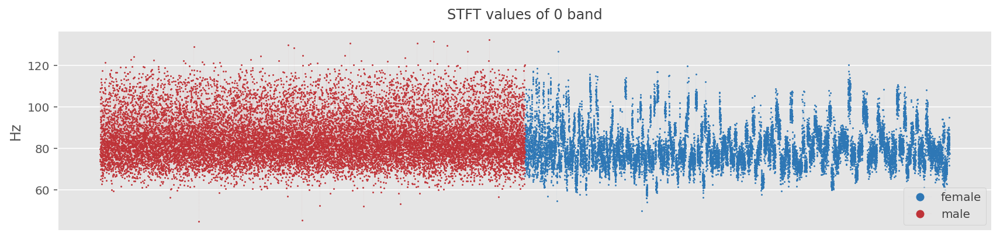

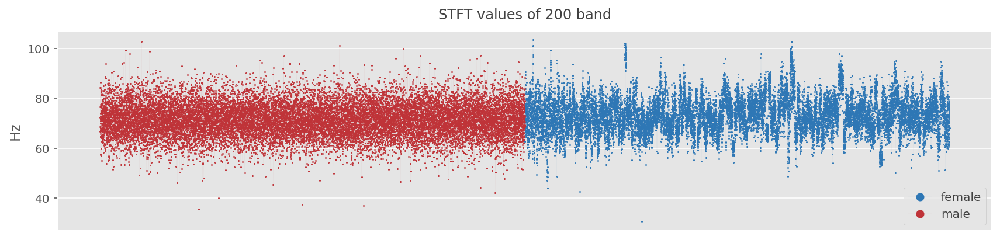

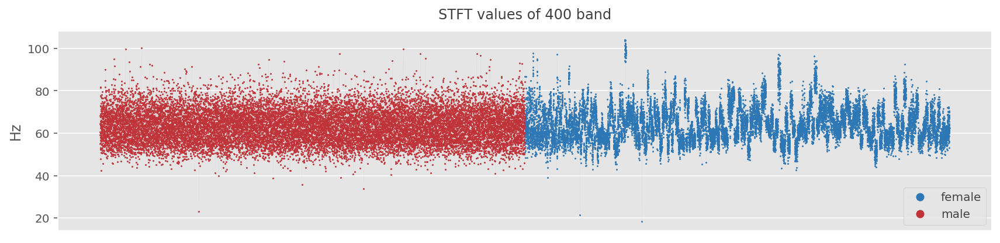

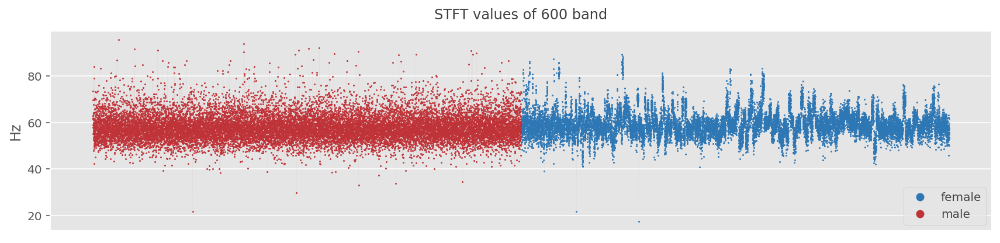

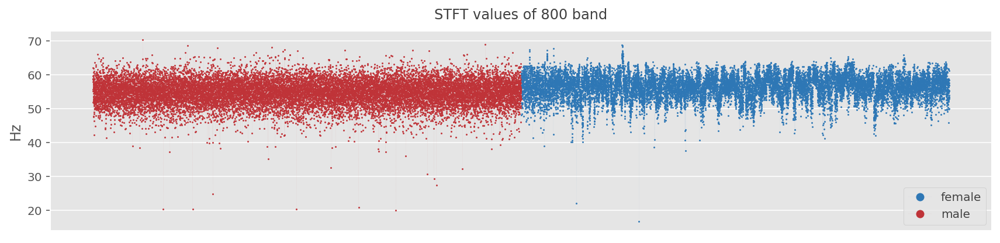

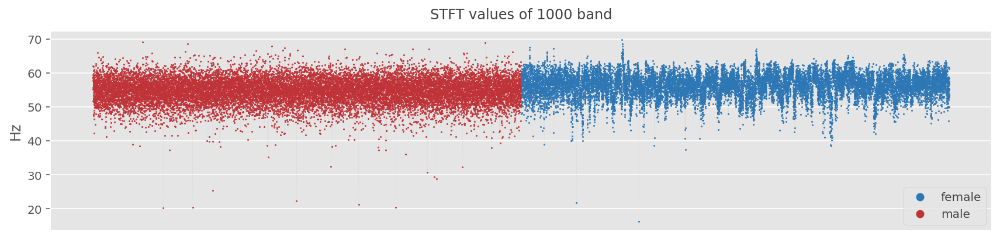

In [52]:
for col in df_stft.columns[:1025:200]:
    plt.figure(figsize=(12,3))
    df_stft[col].iloc[17561:].plot(lw=.01, marker='.', color=COLOR_FEMALE, markersize=1)
    df_stft[col].iloc[:17561].plot(lw=.01, marker='.', color=COLOR_MALE, markersize=1)
    plt.title(f"STFT values of {col} band", size=12, pad=10)
    plt.xticks([])
    plt.ylabel("Hz")
    plt.legend(["female", "male"], markerscale=12, loc="lower right")
    plt.tight_layout()
    plt.show()

- **Plotting all MFCC data points shows the gender difference in the various frequency bands too.** 
- Again the male samples are more evenly distributed than the female samples. 
- A lot of outlying recordings seem to be present.

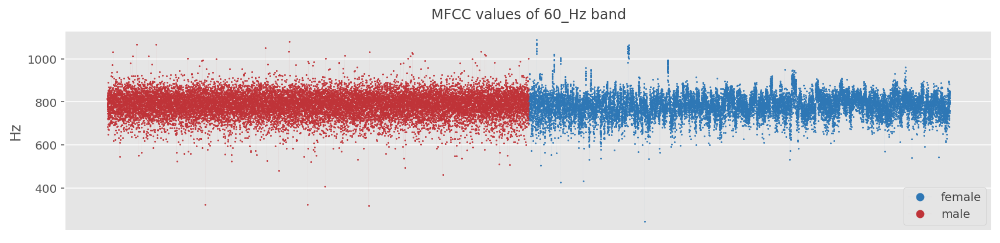

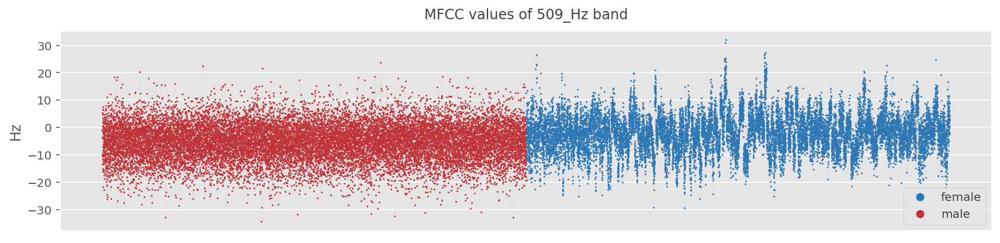

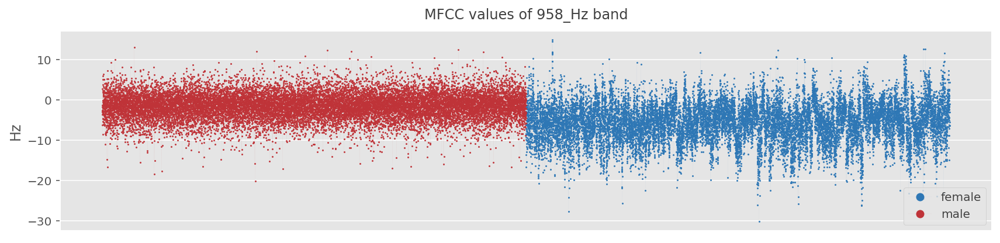

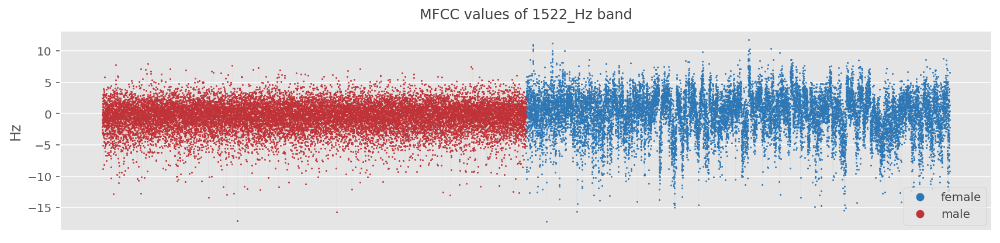

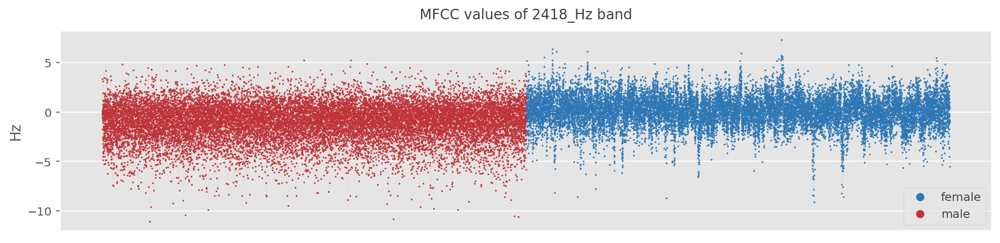

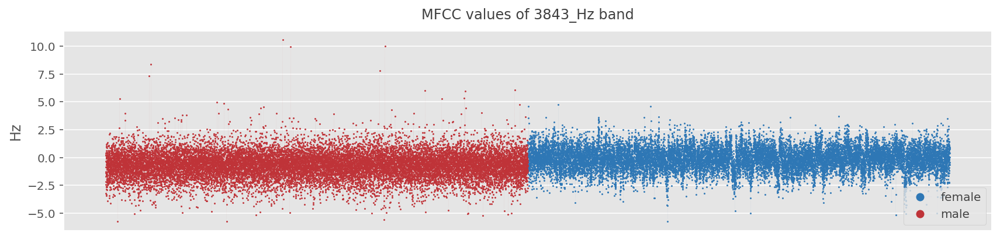

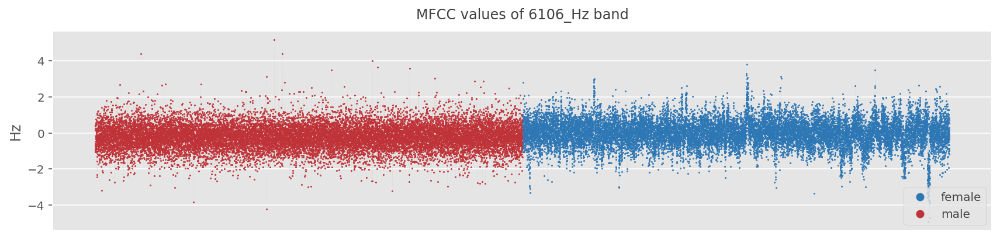

In [53]:
for col in df_mfcc.columns[:80:12]:
    plt.figure(figsize=(12,3))
    df_mfcc[col].iloc[17561:].plot(lw=.01, marker='.', color=COLOR_FEMALE, markersize=1)
    df_mfcc[col].iloc[:17561].plot(lw=.01, marker='.', color=COLOR_MALE, markersize=1)
    plt.title(f"MFCC values of {col} band", size=12, pad=10)
    plt.xticks([])
    plt.ylabel("Hz")
    plt.legend(["female", "male"], markerscale=12, loc="lower right")
    plt.tight_layout()
    plt.show()

**Correlations within STFT features**

By calculating and plotting the correlations within the STFT features I see:

- There are three distinct correlation «blocks» visible, **indicating that there is a lot of redundancy / colinearity within the features itself.**
- This is **most pronounced between features 700 up to 1025** where every feature has an **almost perfect correlation of 1 to each other.**
- Since the STFT features represent frequency I assume that there is not much distinction at all in higher frequency. This intuitively makes sense since I extracted the features from speech samples and most of the signal will be in the lower to midtone frequencies.

I gather from this that **I should be able to reduce dimensionality substantially by PCA without loosing to much signal.**

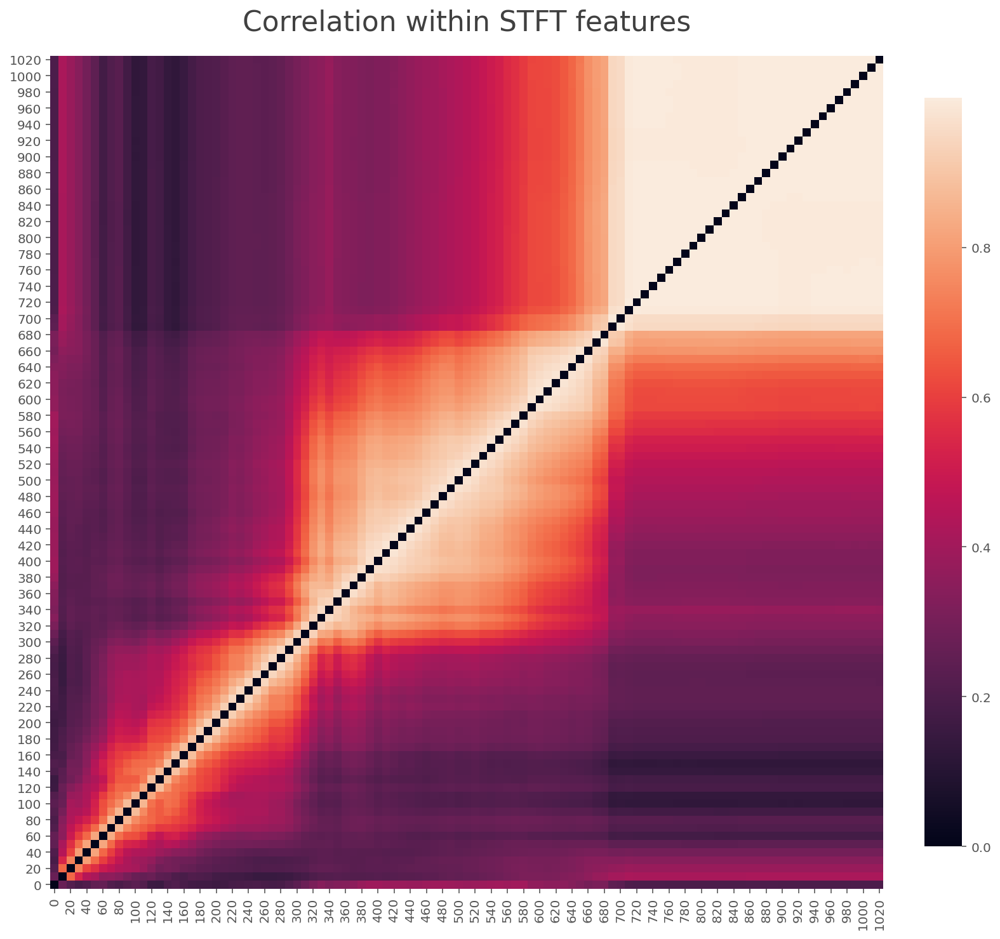

In [54]:
# just take every 10th feature to speed up calculation
subset = df_stft.iloc[:, ::10].reset_index(drop=True)
corr = subset.corr()
corr = corr.values

# set diagonal to 0 since these are correlations of features with themselves and aren't meaningful
np.fill_diagonal(corr, 0)
df_corr = pd.DataFrame(corr)
df_corr.columns = subset.columns
df_corr.index = subset.columns

plt.figure(figsize=(12,12))
sns.heatmap(df_corr.iloc[::-1], 
            annot=False, 
            square=True,
            vmin=corr.min().min(),
            vmax=corr.max().max(),
            cbar_kws={"shrink": .7, "pad":0.04})
plt.title("Correlation within STFT features", size=TITLE_SIZE, pad=20)
plt.tight_layout()
plt.show()

**Correlations within MFCCs features**
- For most of the bands between 2.5kHz up to roughly 6kHz there is a **strong correlation visible to adjacent features**. This suggests that I could use less bands in higher frequencies and probably get a comparable amount of information.
- In the lower bands from 0 to 2kHz there seem to exist **some kind of correlation «echo» into other bands**, resulting in  pronounced «lines» in the heatmap. I imagine that these are representations of distinct components of the audio signal throughout various bands that MFCC can pickup and represent. 

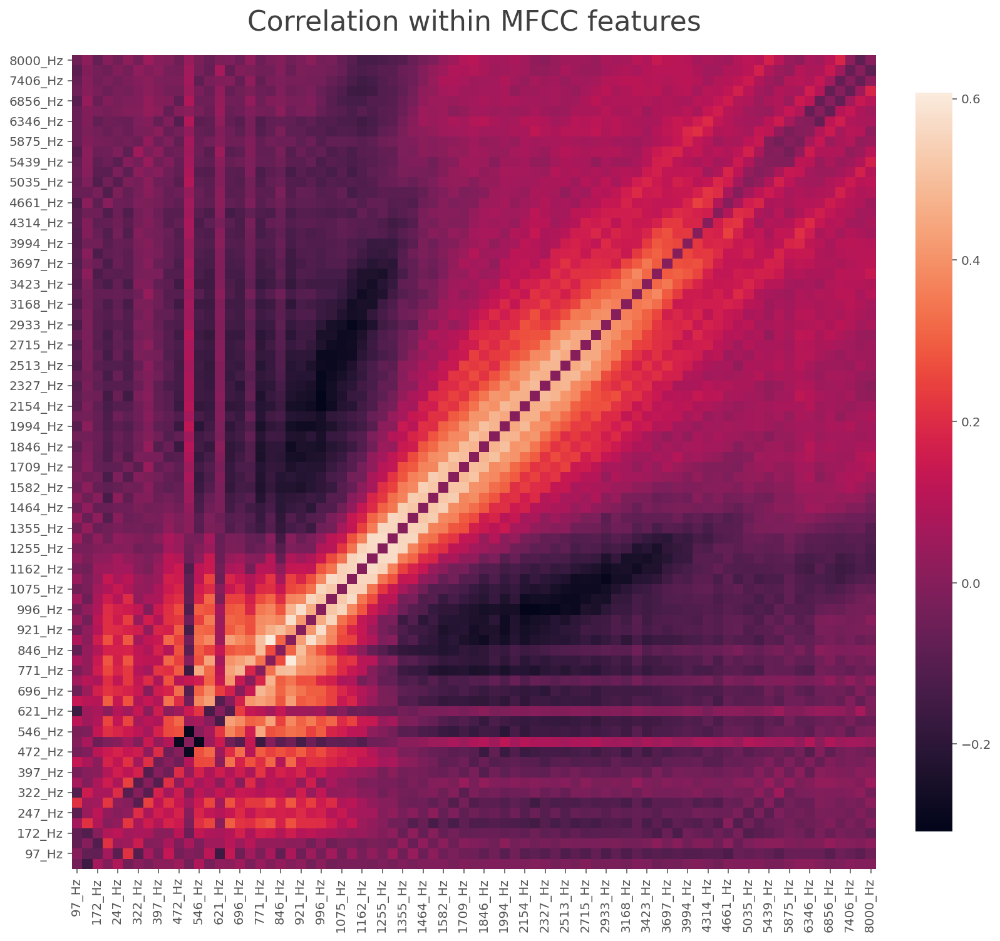

In [55]:
corr = df_mfcc.corr()
corr = corr.values

# set diagonal to 0 since these are correlations of features with themselves and aren't meaningful
np.fill_diagonal(corr, 0)
df_corr = pd.DataFrame(corr, index=df_mfcc.columns, columns=df_mfcc.columns)

plt.figure(figsize=(12,12))
sns.heatmap(df_corr.iloc[::-1, 1::], 
            annot=False, 
            square=True,
            vmin=corr.min().min(),
            vmax=corr.max().max(),
            cbar_kws={"shrink": .7, "pad":0.04})
plt.title("Correlation within MFCC features", size=TITLE_SIZE, pad=20)
plt.tight_layout()
plt.show()

### Reducing dimensionality for STFT features

In [56]:
def reduce_dimensionality(data, ylim=100, scaling=False):
    if scaling==True:
        scaler = StandardScaler()
        data = scaler.fit_transform(data)
    
    pca = PCA()
    _ = pca.fit(data)
    
    df_pca = pd.DataFrame(pca.explained_variance_ratio_, columns=["explained_variance"]).cumsum()
    df_pca.index = df_pca.index + 1
    df_pca.loc[0] = 0
    df_pca.sort_index(inplace=True)
    print("Cumulative sum of explained variance of PCA per n_components")
    print(tabulate(df_pca.iloc[10:110:10]))
    
    df_pca.plot(figsize=(12,5))
    plt.title("Cumulative explained variance for n PCA components", size=TITLE_SIZE, pad=20)
    plt.xlabel("PCA n_components")
    plt.ylabel("Total explained variance")
    plt.xticks(np.linspace(0, ylim, int(ylim/10+1)))
    plt.yticks(np.linspace(0, 1, int(ylim/10+1)))
    plt.xlim(-1,ylim)
    plt.ylim(0, 1)
    plt.legend([])
    plt.tight_layout()
    plt.show()

For **STFTs** reducing the dimensionality with PCA works well: 
- **Just 10 components yield more than 90% of the variance.** 
- **With 40 components I get 98% and I decide to settle for that.**
- Standard scaling the data before PCAing improved dimensionality reduction a little bit. E.g. 10 features explain 93% vs. 91% unscaled.

Cumulative sum of explained variance of PCA per n_components
---  --------
 10  0.928688
 20  0.964564
 30  0.977636
 40  0.983873
 50  0.987557
 60  0.989986
 70  0.991707
 80  0.992974
 90  0.993971
100  0.994763
---  --------


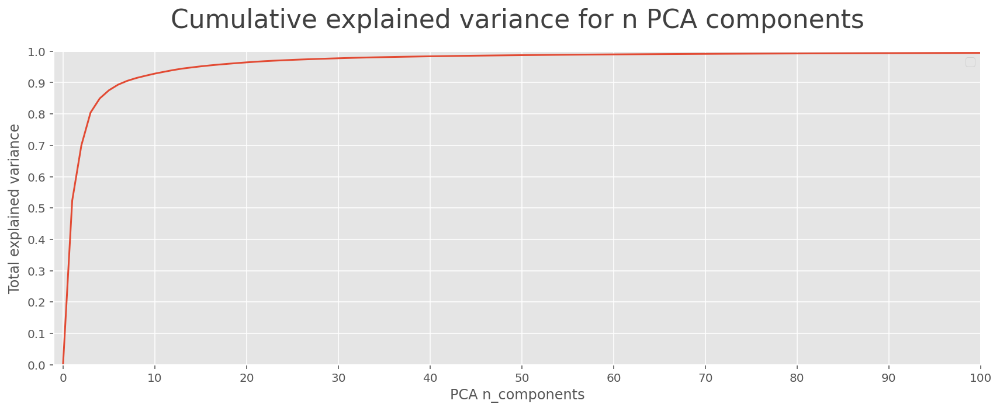

In [57]:
reduce_dimensionality(df_stft, scaling=True)

In [58]:
# reducing the STFT dimensions to 40 components
scaler = StandardScaler()
data = scaler.fit_transform(df_stft)

pca = PCA(n_components=40)
stft_pca = pca.fit_transform(data)
df_stft = pd.DataFrame(stft_pca)

### Reducing dimensionality for MFCC features

For **MFCCs** reducing the dimensionality works comparably well (although we come from 80 features being reduced rather than 1025): 
- **Just 10 components yield almost 90% of the variance.** 
- **With 40 components I get 99%.**
- Scaling the data before PCAing yields much worse results.

Since 80 features aren't that much I will leave it as such and not reduce by PCA.

Cumulative sum of explained variance of PCA per n_components
--  --------
10  0.90108
20  0.964369
30  0.984306
40  0.992414
50  0.996298
60  0.99833
70  0.999434
80  1
--  --------


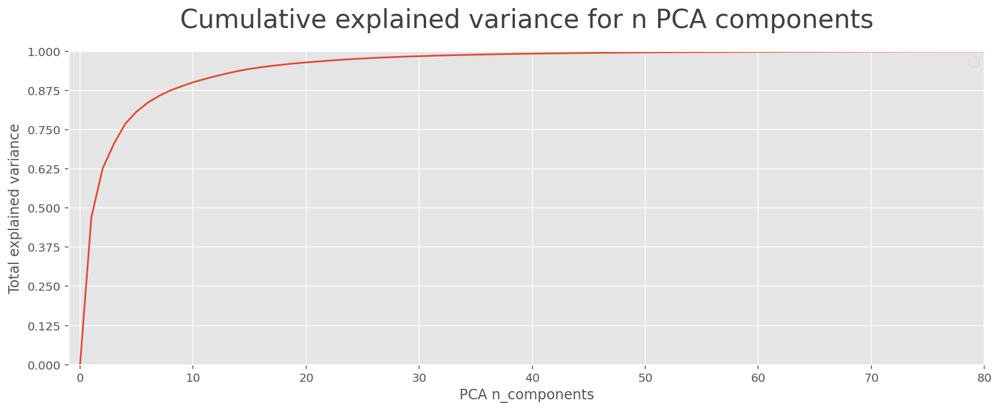

In [59]:
reduce_dimensionality(df_mfcc, ylim=80, scaling=False)

By calculating and plotting the **STFT correlations** (features now reduced to 40) I observe:

- Overall **the features are mostly only weakly correlated to the target**, which suggests that **STFTs might only possibly work as features.**

Since I reduced dimensionality the features aren't interpretable any more.

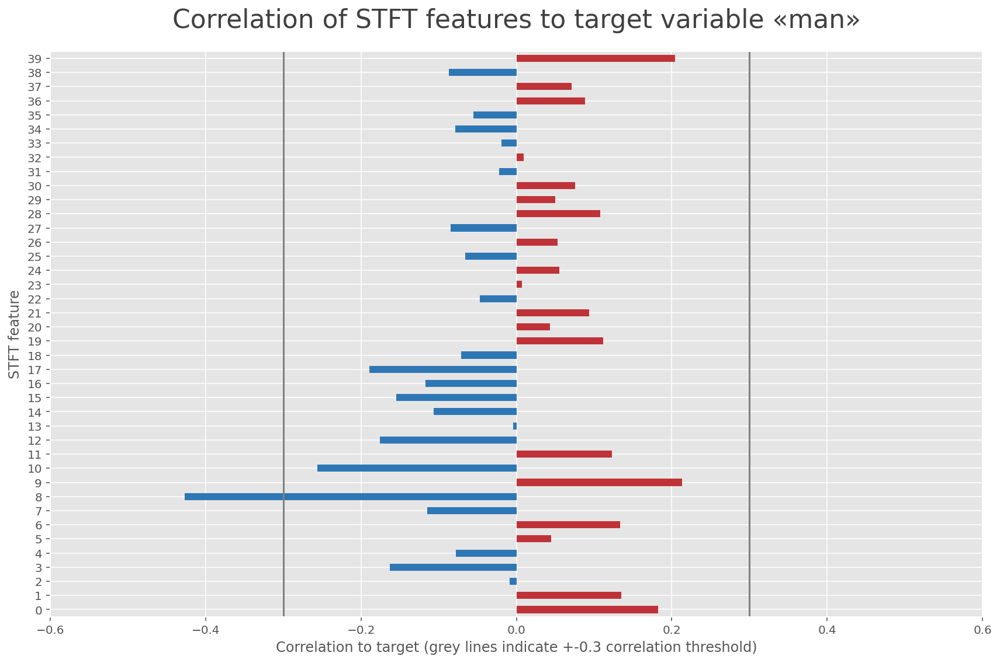

In [60]:
corr = df_stft.corrwith(df_meta.man)
correlation_treshold = 0.3 # lower bound for moderate correlation

color = (corr > 0).apply(lambda x: COLOR_MALE if x else COLOR_FEMALE)

corr.plot.barh(figsize=(12,8), color=color)
plt.title(f"Correlation of STFT features to target variable «man»", size=TITLE_SIZE, pad=20)
plt.axvline(-correlation_treshold, color="grey")
plt.axvline(correlation_treshold, color="grey")
plt.xlabel(f"Correlation to target (grey lines indicate +-{correlation_treshold} correlation threshold)")
plt.ylabel("STFT feature")
plt.xlim(-0.6, 0.6)
plt.tight_layout()
plt.show()

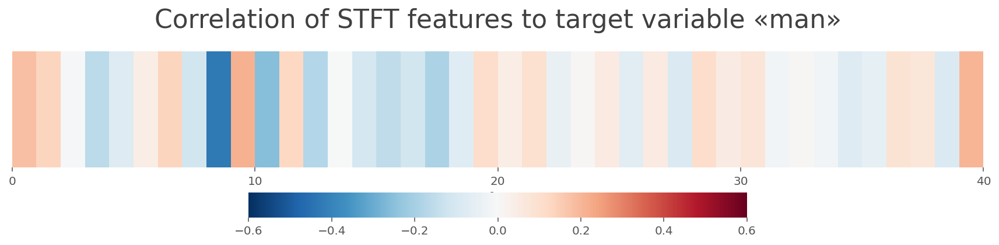

In [61]:
plt.figure(figsize=(12,3))
sns.heatmap(pd.DataFrame(corr).T, 
            cmap="RdBu_r", 
            square=False, 
            annot=False, 
            cbar=True,
            vmin=-0.6,
            vmax=0.6,
            center=0,
            cbar_kws={"orientation": "horizontal", "shrink": .7, "pad":.15}
           )
plt.title(f"Correlation of STFT features to target variable «man»", size=TITLE_SIZE, pad=20)
plt.yticks([])
plt.xlabel("STFT features")
rng = np.arange(0, 45, 10)
plt.xticks(ticks=rng, labels=[str(x) for x in rng], rotation=0)
plt.tight_layout()
plt.show()

By calculating and plotting the **MFCC correlations** I observe:

- Overall **there is a clear correlation, which suggests that MFCCs are suitable as features for my task.**
- Many of the features are weakly to moderately correlated. 

Since the MFCC bands represent a frequency range, each feature is interpretable.
- All but two of the low frequency bands up to around 1.4kHz are positively correlated to male voices. 
- All other bands are negatively correlated to male voices.

This makes sense according to what we know about the gender differences in speech. Lower frequencies can be attributed to male voices, higher pitched voices to female ones. 

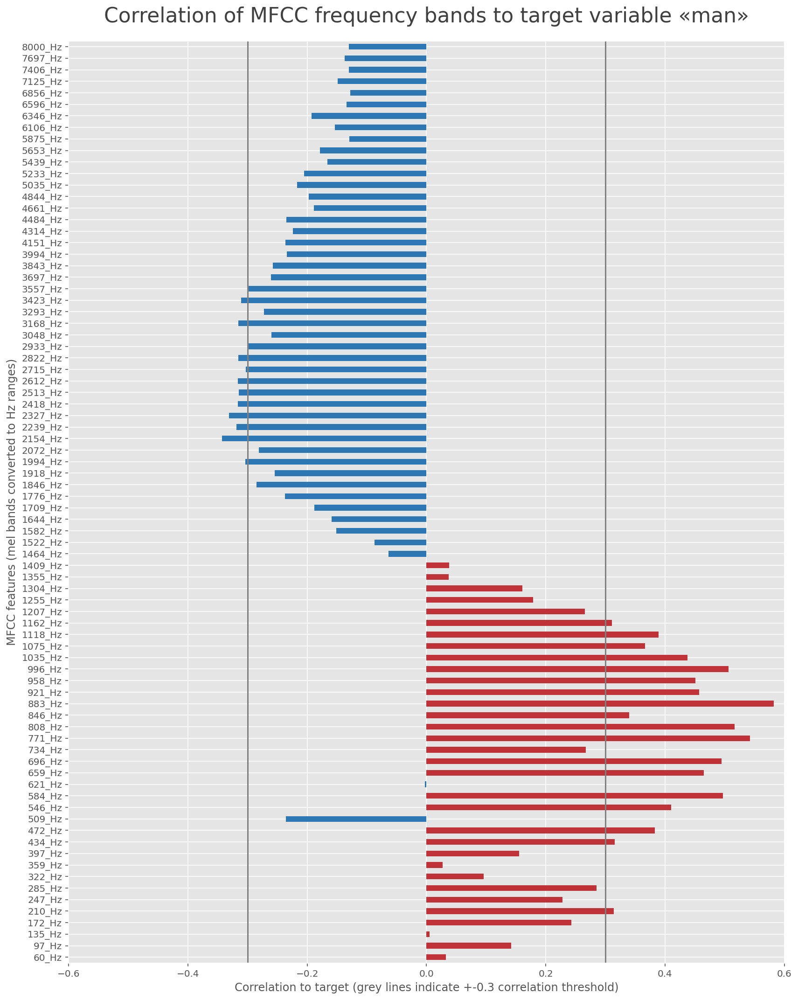

In [62]:
corr = df_mfcc.corrwith(df_meta.man)
correlation_treshold = 0.3 # lower bound for moderate correlation

color = (corr > 0).apply(lambda x: COLOR_MALE if x else COLOR_FEMALE)

corr.plot.barh(figsize=(12,15), color=color)
plt.title(f"Correlation of MFCC frequency bands to target variable «man»", size=TITLE_SIZE, pad=20)
plt.axvline(-correlation_treshold, color="grey")
plt.axvline(correlation_treshold, color="grey")
plt.xlabel(f"Correlation to target (grey lines indicate +-{correlation_treshold} correlation threshold)")
plt.ylabel("MFCC features (mel bands converted to Hz ranges)")
plt.xlim(-0.6, 0.6)
plt.tight_layout()
plt.show()

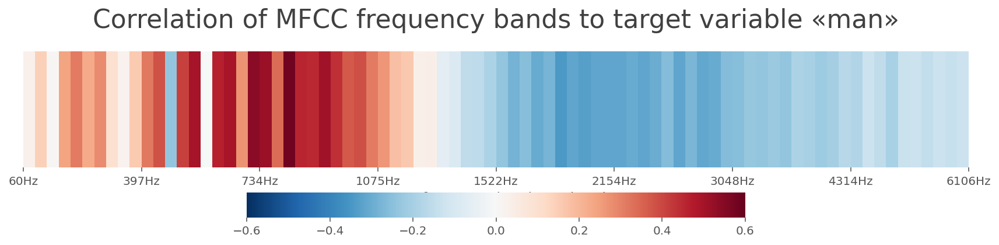

In [63]:
plt.figure(figsize=(12,3))
sns.heatmap(pd.DataFrame(corr).T, 
            cmap="RdBu_r", 
            square=False, 
            annot=False, 
            cbar=True,
            vmin=-0.6,
            vmax=0.6,
            center=0,
            cbar_kws={"orientation": "horizontal", "shrink": .7, "pad":.15}
           )
plt.title(f"Correlation of MFCC frequency bands to target variable «man»", size=TITLE_SIZE, pad=20)
plt.yticks([])
plt.xlabel("MFCC frequency bands, mel scale")
rng = range(0, 85, 10)
plt.xticks(ticks=rng, labels=[f"{x:.0f}Hz" for x in converted_mel_bands_to_Hz[::9]], rotation=0)
plt.tight_layout()
plt.show()

### Reducing and visualizing the features with PCA
- By reducing all feature dimensions to two components and plotting these **I cannot observe a very clear distinction between the two classes**.
- A plot with reduced dimensions by PCA **can** already show distinct cluster of the data. Howevery, **the absence of a clear distinction in the PCA'd data doesn't neccessarily indicate that classes aren't well separable.**
- The plots show outlying samples beyond the large center «clump» of recordings. 
- By manually checking I found that these samples are mostly distorted, noisy or contain reverb. 
- It might make sense to remove these outliers since such bad audio quality is not likely to be present in podcasts. 

In [64]:
def pca_reduce_and_plot(features, labels, alpha=1, title="",
                       legend=["male", "female"], 
                        xlim=None, ylim=None):
    
    pca = PCA(n_components=2, random_state=1)
    feat_pca = pca.fit_transform(features)
    plt.figure(figsize=(12,6))
    
    plt.scatter(feat_pca[labels, 0], feat_pca[labels, 1], 
                color=COLOR_MALE, alpha=alpha)    
    plt.scatter(feat_pca[np.invert(labels), 0], feat_pca[np.invert(labels), 1], 
                color=COLOR_FEMALE, alpha=alpha)   
    
    # https://stackoverflow.com/questions/12848808/set-legend-symbol-opacity-with-matplotlib
    lgd = plt.legend(legend)
    for lh in lgd.legendHandles: 
        lh.set_alpha(1)
        
#     plt.axis('equal')
    plt.title(title, size=TITLE_SIZE, pad=TITLE_PADDING)
    
    plt.xlim(xlim)
    plt.ylim(ylim)
    
    plt.tight_layout()
    plt.show()
    
    return feat_pca

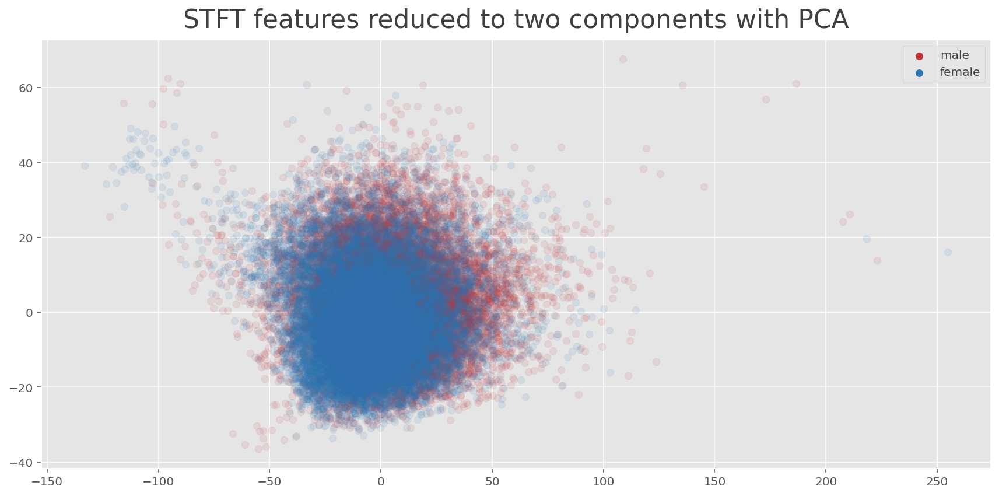

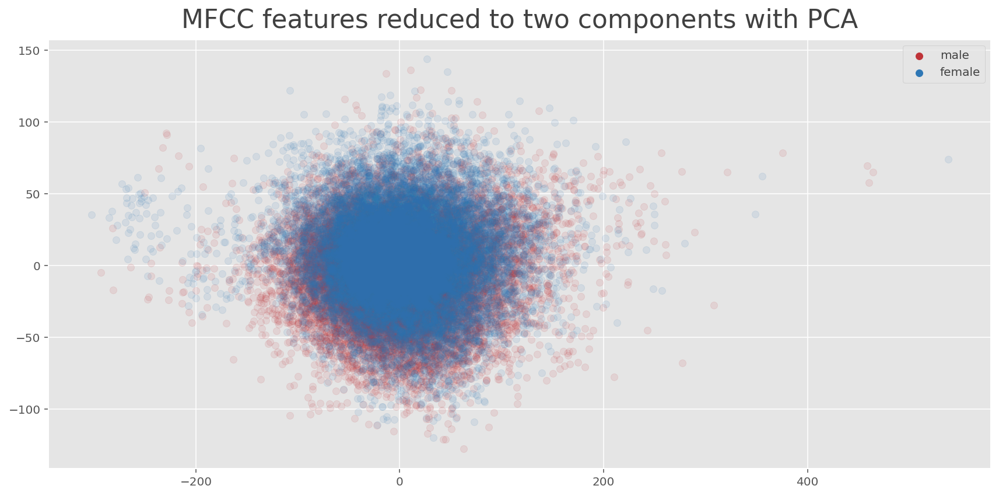

In [65]:
feat_pca = pca_reduce_and_plot(df_stft, df_meta.man, 
                               alpha=.1, 
                               title="STFT features reduced to two components with PCA")

feat_pca = pca_reduce_and_plot(df_mfcc, df_meta.man, 
                               alpha=.1, 
                               title="MFCC features reduced to two components with PCA")

### Reducing and visualizing the features in 2D with UMAP

Reducing and clustering the features with [UMAP](https://umap-learn.readthedocs.io/en/latest/) results in a more distinguished separation between the two classes.

In [66]:
def umap_reduce_and_plot(features, labels, title=None, alpha=1, gender=True, 
                         legend=["male", "female"], cmap="tab20", xlim=None, ylim=None):
    
    umapper = umap.UMAP(n_neighbors=5, random_state=1)
    feat_umap = umapper.fit_transform(features)

    plt.figure(figsize=(12,6))
    
    if gender == True:
        plt.scatter(feat_umap[labels, 0], feat_umap[labels, 1], 
                    color=COLOR_MALE, alpha=alpha)
        plt.scatter(feat_umap[np.invert(labels), 0], feat_umap[np.invert(labels), 1], 
                    color=COLOR_FEMALE, alpha=alpha)

        # https://stackoverflow.com/questions/12848808/set-legend-symbol-opacity-with-matplotlib
        lgd = plt.legend(legend)
        for lh in lgd.legendHandles: 
            lh.set_alpha(1)
    else:
        plt.scatter(feat_umap[:, 0], feat_umap[:, 1], 
            c=labels, cmap=cmap, alpha=alpha)
        
    plt.title(title, size=TITLE_SIZE, pad=TITLE_PADDING)
    plt.axis('equal')
    plt.xlim(xlim)
    plt.ylim(ylim)
    plt.tight_layout()
    plt.show()
    
    return feat_umap

By clustering the **STFT features** with UMAP I observe:
- There is one **large cluster of male and female voices in the center of the plot**.
- This main cluster is not very clearly separated in terms of the target variable. 

I interpret this as **an indication that STFTs might not be a strong predictor in regard to gender separation.**

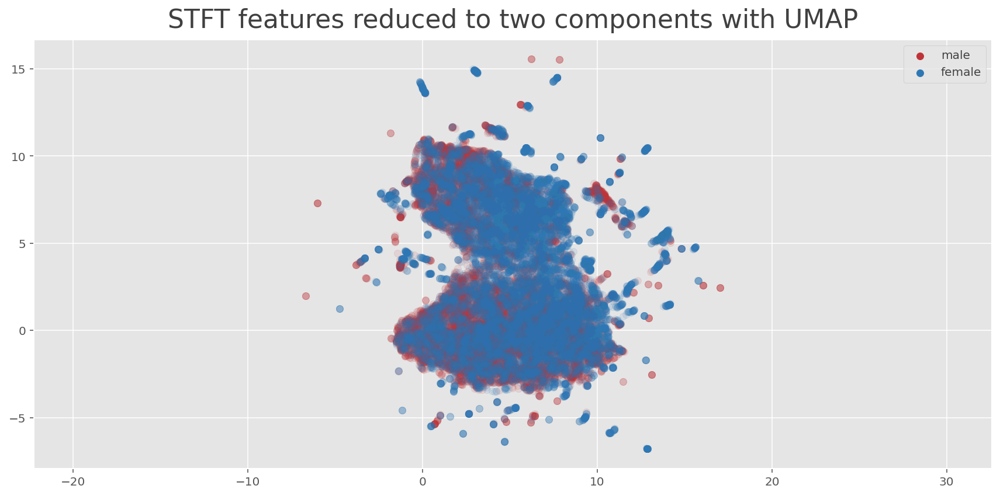

In [67]:
_ = umap_reduce_and_plot(df_stft, df_meta.man, 
                                 title="STFT features reduced to two components with UMAP", 
                                 alpha=.1)

By clustering the **MFCC features** with UMAP and plotting in 2D I observe:
- There is a **large and much clearer separated cluster of male and female voices in the center of the plot**.
- Around the large cluster there are dozens of smaller isolated clusters of mostly female voice samples.

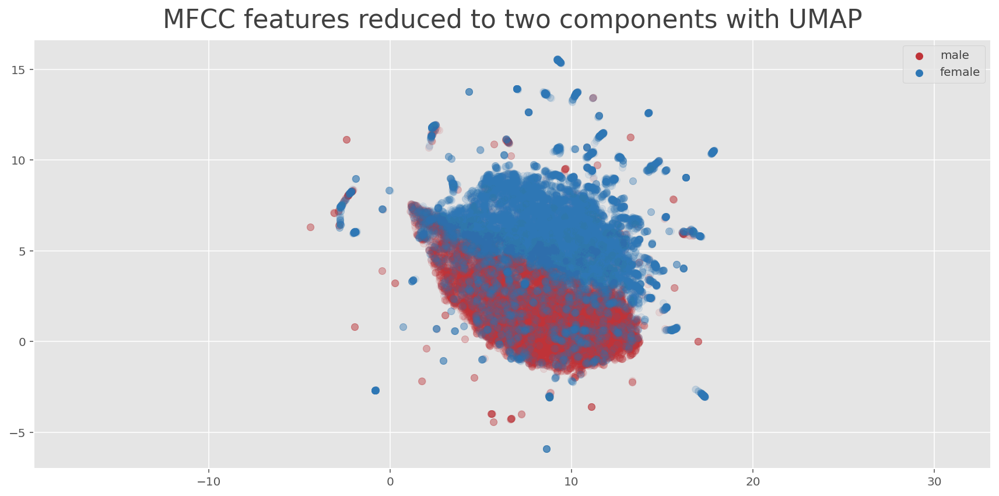

In [68]:
feat_umap = umap_reduce_and_plot(df_mfcc, df_meta.man, 
                                 title="MFCC features reduced to two components with UMAP", 
                                 alpha=.1)

I manually checked samples from several of the smaller UMAP clusters. 
- **Most of these «outlying» samples have a specific acoustic characteristic** e.g. a single contributor with characteristic voice, low audio quality, speaker speaking from a distance. 
- **Since I aim for a wide variety and good generalization I decide to not consider these as problematic outliers and keep them in the training data.**

**Visualizing the samples of the top contributors leads to clearly separated clusters.** This again indicates that I have extracted usable features. 

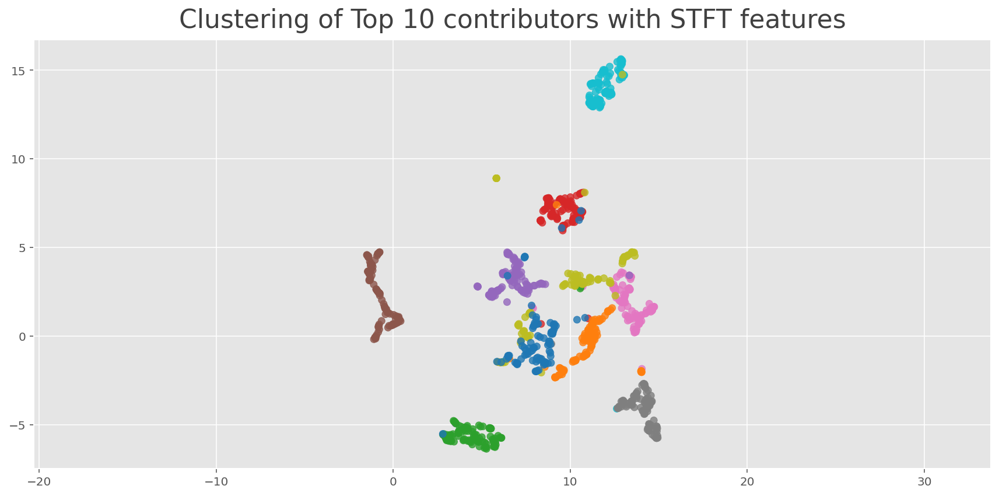

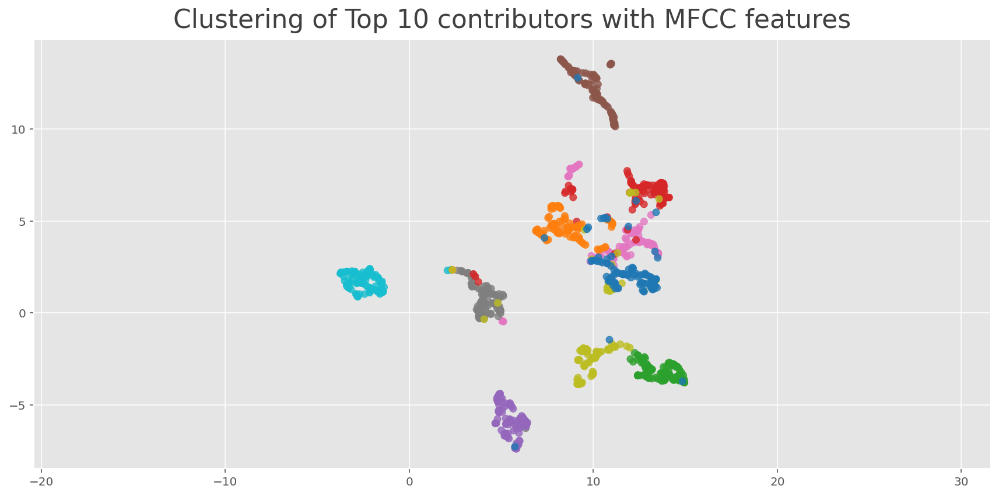

In [69]:
for feature_name, features in zip(["STFT", "MFCC"], [df_stft, df_mfcc]):
    top_n = 10
    top_contrib = df_meta.client_id.value_counts()[:top_n].index
    idx_contrib = df_meta[df_meta.client_id.isin(top_contrib)].index
    contrib_meta = df_meta.iloc[idx_contrib]
    contrib_feat = features.iloc[idx_contrib]
    mapping = dict(zip(top_contrib, range(len(top_contrib))))

    feat_umap = umap_reduce_and_plot(contrib_feat, contrib_meta.client_id.map(mapping),
                                     title=f"Clustering of Top {top_n} contributors with {feature_name} features",
                                     alpha=.8, 
                                     gender=False, 
                                     cmap="tab10"
                                    )

## Identifying outliers
- A quick search for outliers by calculating the IQR and setting a lower/upper threshold of 3 times the IQR reveals between 3-9% of outliers for FO, STFT and MFCC features. 
- I need to evaluate first models to see if the outliers hurt performance. 

In [70]:
for feature_name, features in zip(["FO  ", "MFCC", "STFT"], [df_fO.drop("man", axis=1).dropna(), df_mfcc, df_stft]):
    idx_to_drop = []
    cut_off = 3 # times the IQR

    for col in features.columns:
        q25 = percentile(features[col], 25)
        q75 = percentile(features[col], 75)
        iqr = q75 - q25
        lower = q25 - iqr * cut_off
        upper = q75 + iqr * cut_off
        tmp = (features[(features[col] < lower) | (features[col] > upper)].index)
        idx_to_drop.extend(np.array(tmp))

    idx_to_drop = set(idx_to_drop)
    print(f"{feature_name}: Found {len(idx_to_drop)} ({100/len(features)*len(idx_to_drop):.2f}%) outliers by setting bounds at {cut_off} times the IQR.")

FO  : Found 3130 (8.92%) outliers by setting bounds at 3 times the IQR.
MFCC: Found 1228 (3.50%) outliers by setting bounds at 3 times the IQR.
STFT: Found 2703 (7.70%) outliers by setting bounds at 3 times the IQR.


- Colorizing the outliers in the PCA plot shows That **setting an upper/lower bound of IQR does not catch the unusual samples beyond the large center cluster**. 
- The UMAP plot too shows that outliers and regular samples very much overlap.
- **I therefore might keep the outliers if they don't hurt the models quality**.
- Another approach would be to **manually remove outliers by plotting and finding sensible bounds.** In the PCA plot below e.g. this would be the area beyond +/- 200 on the x-axis.

In [71]:
df_meta["outliers"] = False
df_meta.loc[idx_to_drop, "outliers"] = True

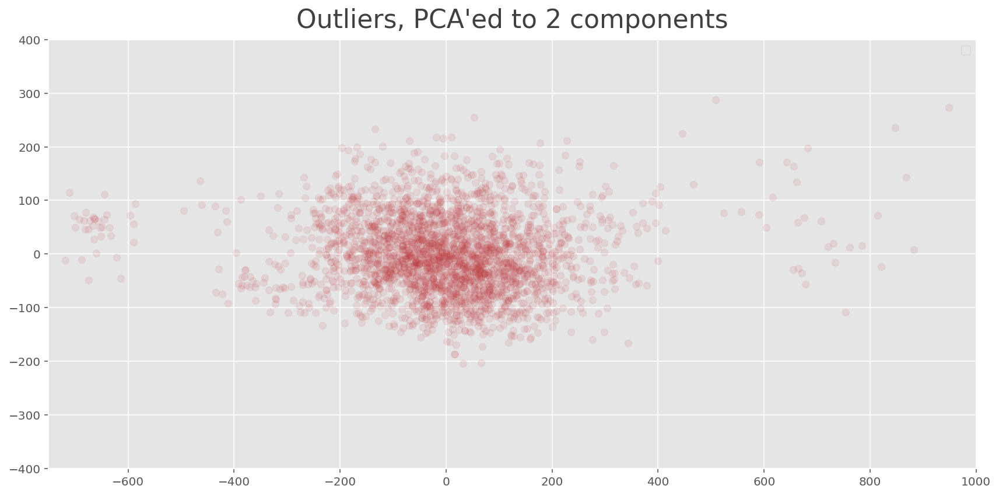

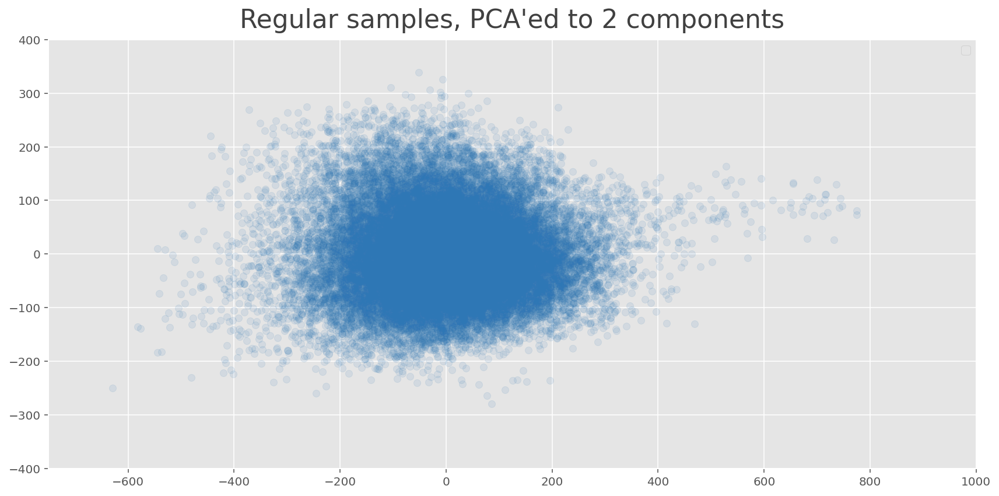

In [72]:
_ = pca_reduce_and_plot(df_features.loc[idx_to_drop], labels=df_meta.loc[idx_to_drop].outliers, 
                        alpha=.1, xlim=(-750, 1000), ylim=(-400, 400), title="Outliers, PCA'ed to 2 components", legend=[])

_ = pca_reduce_and_plot(df_features.drop(idx_to_drop), labels=df_meta.drop(idx_to_drop).outliers, 
                        alpha=.1, xlim=(-750, 1000), ylim=(-400, 400), title="Regular samples, PCA'ed to 2 components", legend=[])

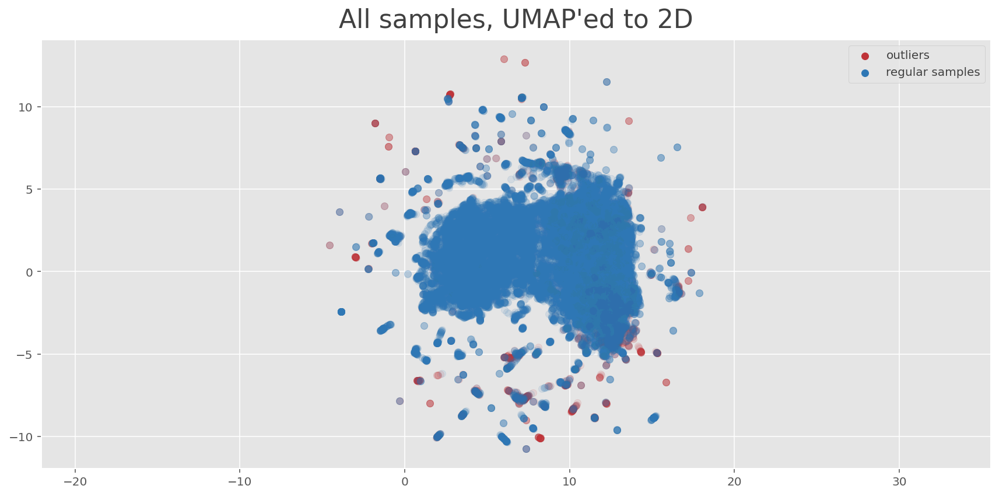

In [73]:
_ = umap_reduce_and_plot(df_features, labels=df_meta.outliers, title="All samples, UMAP'ed to 2D",
                        alpha=.1, legend=["outliers", "regular samples"])